# Project 1: SAT & ACT Analysis

The first markdown cell in a notebook is a great place to provide an overview of your entire project. You will likely want to at least state your

## Problem Statement

The mission of this assignment is:

- To assess trends in ACT and SAT participation rates and performance; and
- To understand factors that affect participation rates and performance; and
- To provide recommendations to improve participation rates and performance in States where they are both low

## Executive Summary

If you want to, it's great to use relative links to direct your audience to various sections of a notebook. **HERE'S A DEMONSTRATION WITH THE CURRENT SECTION HEADERS**:

### Contents:
- [2017 Data Import & Cleaning](#Data-Import-and-Cleaning)
- [2018 Data Import and Cleaning](#2018-Data-Import-and-Cleaning)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [Data Visualization](#Visualize-the-data)
- [Descriptive and Inferential Statistics](#Descriptive-and-Inferential-Statistics)
- [Outside Research](#Outside-Research)
- [Conclusions and Recommendations](#Conclusions-and-Recommendations)

**If you combine your problem statement, executive summary, data dictionary, and conclusions/recommendations, you have an amazing README.md file that quickly aligns your audience to the contents of your project.** Don't forget to cite your data sources!

*All libraries used should be added here*

In [1306]:
#Imports:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


%matplotlib inline

## 2017 Data Import and Cleaning

#### 1. Read In SAT & ACT  Data

Read in the `sat_2017.csv` and `act_2017.csv` files and assign them to appropriately named pandas dataframes.

In [1307]:
#Code:
sat = pd.read_csv('data/sat_2017.csv')
act = pd.read_csv('data/act_2017.csv')



#### 2. Display Data

Print the first 10 rows of each dataframe to your jupyter notebook

In [1308]:
sat.head(10)

,State,Participation,Evidence-Based Reading and Writing,Math,Total
0,Alabama,5%,593,572,1165
1,Alaska,38%,547,533,1080
2,Arizona,30%,563,553,1116
3,Arkansas,3%,614,594,1208
4,California,53%,531,524,1055
5,Colorado,11%,606,595,1201
6,Connecticut,100%,530,512,1041
7,Delaware,100%,503,492,996
8,District of Columbia,100%,482,468,950
9,Florida,83%,520,497,1017


In [1309]:
act.head(10)

,State,Participation,English,Math,Reading,Science,Composite
0,National,60%,20.3,20.7,21.4,21.0,21.0
1,Alabama,100%,18.9,18.4,19.7,19.4,19.2
2,Alaska,65%,18.7,19.8,20.4,19.9,19.8
3,Arizona,62%,18.6,19.8,20.1,19.8,19.7
4,Arkansas,100%,18.9,19.0,19.7,19.5,19.4
5,California,31%,22.5,22.7,23.1,22.2,22.8
6,Colorado,100%,20.1,20.3,21.2,20.9,20.8
7,Connecticut,31%,25.5,24.6,25.6,24.6,25.2
8,Delaware,18%,24.1,23.4,24.8,23.6,24.1
9,District of Columbia,32%,24.4,23.5,24.9,23.5,24.2


#### 3. Verbally Describe Data

Take your time looking through the data and thoroughly describe the data in the markdown cell below. 

## Answer:

Both datasets describe the average SAT and ACT scores across 50 states, however the ACT dataset includes information on a national level. 

SAT scores are measured based on a sum of two test scores, (i) evidence-based reading and writing and (ii) math. However, ACT scores are measured based on the average of 4 test scores, (i) English, (ii) Math, (iii) Reading and (iv) Science.

SAT scores are also reported in a larger magnitude in comparison to ACT scores (e.g. min-max for SAT Evidence-Based Reading and Writing is 482-644, min-max for ACT English is 16-25) which may suggest that SAT scores are reported based on raw data (e.g. how many correct answers) whereas ACT scores are reported on a scale-basis.

## Backup Data: SAT

In [1310]:
#Code:
print("SAT Descriptive Statistics")
print(sat.describe())

print("\n")

print("SAT - Shape")
print(sat.shape)

print("\n")

print("SAT - Information")
print(sat.info())

SAT Descriptive Statistics
       Evidence-Based Reading and Writing        Math        Total
count                           51.000000   51.000000    51.000000
mean                           569.117647  547.627451  1126.098039
std                             45.666901   84.909119    92.494812
min                            482.000000   52.000000   950.000000
25%                            533.500000  522.000000  1055.500000
50%                            559.000000  548.000000  1107.000000
75%                            613.000000  599.000000  1212.000000
max                            644.000000  651.000000  1295.000000


SAT - Shape
(51, 5)


SAT - Information
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51 entries, 0 to 50
Data columns (total 5 columns):
State                                 51 non-null object
Participation                         51 non-null object
Evidence-Based Reading and Writing    51 non-null int64
Math                                  51 non-null int64


## Backup Data: ACT

In [1311]:
#Code:
print("ACT Descriptive Statistics")
print(act.describe())

print("\n")

print("ACT - Shape")
print(act.shape)

print("\n")

print("ACT - Information")
print(act.info())

ACT Descriptive Statistics
         English       Math    Reading    Science
count  52.000000  52.000000  52.000000  52.000000
mean   20.919231  21.173077  22.001923  21.040385
std     2.332132   1.963602   2.048672   3.151113
min    16.300000  18.000000  18.100000   2.300000
25%    19.000000  19.400000  20.475000  19.900000
50%    20.550000  20.900000  21.700000  21.150000
75%    23.300000  23.100000  24.125000  22.525000
max    25.500000  25.300000  26.000000  24.900000


ACT - Shape
(52, 7)


ACT - Information
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 7 columns):
State            52 non-null object
Participation    52 non-null object
English          52 non-null float64
Math             52 non-null float64
Reading          52 non-null float64
Science          52 non-null float64
Composite        52 non-null object
dtypes: float64(4), object(3)
memory usage: 2.9+ KB
None


#### 4a. Does the data look complete? 

## Answer:
The data looks complete, however there could be an additional line in the SAT data to report national statistics.

#### 4b. Are there any obvious issues with the observations?

**What is the minimum *possible* value for each test/subtest? What is the maximum *possible* value?**

Consider comparing any questionable values to the sources of your data:
- [SAT](https://blog.collegevine.com/here-are-the-average-sat-scores-by-state/)
- [ACT](https://blog.prepscholar.com/act-scores-by-state-averages-highs-and-lows)

## Answer:
Yes, based on the descriptive statistics, the minimums for SAT Maths and ACT Science are very low compared to its respective dataset variables. Which may be a result of reporting error.

Comparing to the sources, it can be seen that Maryland's SAT Maths scores and ACT Science scores that have been included in the data file are incorrect. 

There is also an extra 'x' in Wyoming's ACT composite score, which will not have been factored into the 'descriptive statistics' calculation above given it is an object and not a number - and as a result may slightly skew the results.

## SAT - Max-Min

In [1312]:
print("SAT - Minimum")
print(sat.min())
print("\n")
print("SAT - Maximum")
print(sat.max())

SAT - Minimum
State                                 Alabama
Participation                             10%
Evidence-Based Reading and Writing        482
Math                                       52
Total                                     950
dtype: object


SAT - Maximum
State                                 Wyoming
Participation                             96%
Evidence-Based Reading and Writing        644
Math                                      651
Total                                    1295
dtype: object


## ACT - Max-Min

In [1313]:
print("ACT - Minimum")
print(act.min())
print("\n")
print("ACT - Maximum")
print(act.max())

ACT - Minimum
State            Alabama
Participation        60%
English             16.3
Math                  18
Reading             18.1
Science              2.3
Composite           17.8
dtype: object


ACT - Maximum
State            Wyoming
Participation        98%
English             25.5
Math                25.3
Reading               26
Science             24.9
Composite           25.5
dtype: object


#### 4c. Fix any errors you identified

**The data is available** so there's no need to guess or calculate anything. If you didn't find any errors, continue to the next step.

In [1314]:
act['Science'][21] = 23.2  #Replaces error in Maryland's Science ACT scores
sat['Math'][20] = 524 #Replaces error in Maryland's Math SAT scores
act['Composite'][51] = 20.2 #Removes 'x' from '20.2x' in Wyoming's ACT Composite Scores

/Users/lynn/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Users/lynn/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/lynn/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports unti

#### 5. What are your data types? 
Display the data types of each feature. 

## SAT Feature Data Types

In [1315]:
sat.dtypes

State                                 object
Participation                         object
Evidence-Based Reading and Writing     int64
Math                                   int64
Total                                  int64
dtype: object

## ACT Feature Data Types

In [1316]:
act.dtypes

State             object
Participation     object
English          float64
Math             float64
Reading          float64
Science          float64
Composite         object
dtype: object

What did you learn?
- Do any of them seem odd?  
- Which ones are not as they should be?  

## Answer:
Participation rates for both ACT and SAT data should be floats instead of objects, however they are considered objects in Python due to the addition of the '%' sign. 

ACT Composite scores should also be also be a float but have been turned into an object type given the error identified previously where Wyoming's composite scores had an additional 'x' at the end.

#### 6. Fix Incorrect Data Types
Based on what you discovered above, use appropriate methods to re-type incorrectly typed data.
- Define a function that will allow you to convert participation rates to an appropriate numeric type. Use `map` or `apply` to change these columns in each dataframe.

In [1317]:
sat['Participation']=sat['Participation'].map(lambda x:x.replace('%',' ')) #removes % sign from 'Participation' data in SAT
act['Participation']=act['Participation'].map(lambda x:x.replace('%',' ')) #removes % sign from 'Participation' data in ACT

- Fix any individual values preventing other columns from being the appropriate type.

Already completed in step 4c. Code entered as below:
act['Composite'][51] = 20.2 

This step removes 'x' from '20.2x' in Wyoming's ACT Composite Scores

- Finish your data modifications by making sure the columns are now typed appropriately.

In [1318]:
#astype(float) converts the specified data to floats
act['Participation'] = act['Participation'].astype(float)
sat['Participation'] = sat['Participation'].astype(float)
act['Composite'] = act['Composite'].astype(float)

- Display the data types again to confirm they are correct.

In [1319]:
print('SAT - Data Types (Revised)')
sat.dtypes
#Participation has been converted to float

SAT - Data Types (Revised)


State                                  object
Participation                         float64
Evidence-Based Reading and Writing      int64
Math                                    int64
Total                                   int64
dtype: object

In [1320]:
print('ACT - Data Types (Revised)')
act.dtypes
#Participation and Composite has been converted to float

ACT - Data Types (Revised)


State             object
Participation    float64
English          float64
Math             float64
Reading          float64
Science          float64
Composite        float64
dtype: object

#### 7. Rename Columns
Change the names of the columns to more expressive names so that you can tell the difference the SAT columns and the ACT columns. Your solution should map all column names being changed at once (no repeated singular name-changes). **We will be combining these data with some of the data from 2018, and so you should name columns in an appropriate way**.

**Guidelines**:
- Column names should be all lowercase (you will thank yourself when you start pushing data to SQL later in the course)
- Column names should not contain spaces (underscores will suffice--this allows for using the `df.column_name` method to access columns in addition to `df['column_name']`.
- Column names should be unique and informative (the only feature that we actually share between dataframes is the state).

In [1321]:
act_newcols = {
        'State':'state',
        'Participation':'act2017_participation',
        'English':'act2017_english',
        'Math':'act2017_math',
        'Reading':'act2017_reading',
        'Science':'act2017_science',
        'Composite':'act2017_composite'
    }
act.rename(columns=act_newcols,inplace=True)
act.columns

Index(['state', 'act2017_participation', 'act2017_english', 'act2017_math',
       'act2017_reading', 'act2017_science', 'act2017_composite'],
      dtype='object')

In [1322]:
sat_newcols = {
        'State':'state',
        'Participation':'sat2017_participation',
        'Evidence-Based Reading and Writing':'sat2017_reading_writing',
        'Math':'sat2017_math',
        'Total':'sat2017_total',
    }

sat.rename(columns=sat_newcols,inplace=True)
sat.columns

Index(['state', 'sat2017_participation', 'sat2017_reading_writing',
       'sat2017_math', 'sat2017_total'],
      dtype='object')

#### 8. Create a data dictionary

Now that we've fixed our data, and given it appropriate names, let's create a [data dictionary](http://library.ucmerced.edu/node/10249). 

A data dictionary provides a quick overview of features/variables/columns, alongside data types and descriptions. The more descriptive you can be, the more useful this document is.

Example of a Fictional Data Dictionary Entry: 

|Feature|Type|Dataset|Description|
|---|---|---|---|
|**county_pop**|*integer*|2010 census|The population of the county (units in thousands, where 2.5 represents 2500 people).| 
|**per_poverty**|*float*|2010 census|The percent of the county over the age of 18 living below the 200% of official US poverty rate (units percent to two decimal places 98.10 means 98.1%)|

[Here's a quick link to a short guide for formatting markdown in Jupyter notebooks](https://jupyter-notebook.readthedocs.io/en/stable/examples/Notebook/Working%20With%20Markdown%20Cells.html).

Provided is the skeleton for formatting a markdown table, with columns headers that will help you create a data dictionary to quickly summarize your data, as well as some examples. **This would be a great thing to copy and paste into your custom README for this project.**

|Feature|Type|Dataset|Description|
|---|---|---|---|
|state|object|ACT/SAT|US State| 
|act2017_participation|float|ACT|State participation rate in percentage terms in 2017| 
|act2017_english|float|ACT|ACT English Scores in 2017|
|act2017_math|float|ACT|ACT Math Scores in 2017|
|act2017_reading|float|ACT|ACT Reading Scores in 2017|
|act2017_science|float|ACT|ACT Science Scores in 2017|
|act2017_composite|float|ACT|ACT Composite Scores in 2017|
|sat2017_participation|float|SAT|State participation rate in percentage terms in 2017|
|sat2017_reading_writing|int|SAT|SAT Evidence-Based Reading and Writing Scores in 2017|
|sat2017_math|int|SAT|SAT Math Scores in 2017|
|sat2017_total|int|SAT|SAT Total Scores in 2017|
|act2018_participation|float|ACT|State participation rate in percentage terms in 2018| 
|act2018_english|float|ACT|ACT English Scores in 2018|
|act2018_math|float|ACT|ACT Math Scores in 2018|
|act2018_reading|float|ACT|ACT Reading Scores in 2018|
|act2018_science|float|ACT|ACT Science Scores in 2018|
|act2018_composite|float|ACT|ACT Composite Scores in 2018|
|sat2018_participation|float|SAT|State participation rate in percentage terms in 2018|
|sat2018_reading_writing|int|SAT|SAT Evidence-Based Reading and Writing Scores in 2018|
|sat2018_math|int|SAT|SAT Math Scores in 2018|
|sat2018_total|int|SAT|SAT Total Scores in 2018|
|hh_income17|float|-|Median Household Income by State in 2017|
|percentage_white|float|-|Percentage of White Ethnicity Households by State in 2017|
|percentage_asian|float|-|Percentage of Asian Ethnicity Households by State in 2017|
|white_students|float|-|Percentage of White Ethnicity Students enrolled in SAT by State in 2018|

#### 9. Drop unnecessary rows

One of our dataframes contains an extra row. Identify and remove this from the dataframe.

In [1323]:
act.drop(0,inplace=True) #drops row with index=0 which reports national statistics. Inplace=True ensures the change stays
act.reset_index(drop=True, inplace=True) #resets the dataset index to 0
act.head() #check to ensure the changes have taken place

,state,act2017_participation,act2017_english,act2017_math,act2017_reading,act2017_science,act2017_composite
0,Alabama,100.0,18.9,18.4,19.7,19.4,19.2
1,Alaska,65.0,18.7,19.8,20.4,19.9,19.8
2,Arizona,62.0,18.6,19.8,20.1,19.8,19.7
3,Arkansas,100.0,18.9,19.0,19.7,19.5,19.4
4,California,31.0,22.5,22.7,23.1,22.2,22.8


#### 10. Merge Dataframes

Join the 2017 ACT and SAT dataframes using the state in each dataframe as the key. Assign this to a new variable.

In [1324]:
combined_2017 = pd.merge(sat,act,on='state')
combined_2017.shape

(51, 11)

#### 11. Save your cleaned, merged dataframe

Use a relative path to save out your data as `combined_2017.csv`.

In [1325]:
combined_2017.to_csv('data/combined_2017.csv')

## 2018 Data Import and Cleaning

Links to the 2018 ACT and SAT data are provided in the README. These data live in PDFs, and so you'll get to enjoy practicing some *manual* data collection. Save these data as a CSV in your `data` directory, and import, explore, and clean these data in the same way you did above. **Make sure you comment on your steps so it is clear *why* you are doing each process**.

In [1326]:
sat_2018 = pd.read_csv('data/sat_2018.csv')
act_2018 = pd.read_csv('data/act_scraped_2018.csv')

In [1327]:
sat_2018.head()

,State,Participation,Evidence-Based Reading and Writing,Math,Total
0,Alabama,6%,595,571,1166
1,Alaska,43%,562,544,1106
2,Arizona,29%,577,572,1149
3,Arkansas,5%,592,576,1169
4,California,60%,540,536,1076


In [1328]:
act_2018.head()

,State,Percentage of Students Tested,Average English Score,Average Math Score,Average Reading Score,Average Science Score,Average Composite Score
0,Alabama,100,18.9,18.3,19.6,19.0,19.1
1,Alaska,33,19.8,20.6,21.6,20.7,20.8
2,Arizona,66,18.2,19.4,19.5,19.2,19.2
3,Arkansas,100,19.1,18.9,19.7,19.4,19.4
4,California,27,22.5,22.5,23.0,22.1,22.7


In [1329]:
#Checking data types to be consistent with 2017 data
print(sat_2018.dtypes)
act_2018.dtypes

State                                 object
Participation                         object
Evidence-Based Reading and Writing     int64
Math                                   int64
Total                                  int64
dtype: object


State                             object
Percentage of Students Tested      int64
Average English Score            float64
Average Math Score               float64
Average Reading Score            float64
Average Science Score            float64
Average Composite Score          float64
dtype: object

In [1330]:
#Take away the % sign from sat_2018 participation rates and convert it into float
sat_2018['Participation']=sat_2018['Participation'].map(lambda x:x.replace('%',' ')) #removes % sign from 'Participation' data in SAT
sat_2018['Participation'] = sat_2018['Participation'].astype(float) #converts the data types into float

In [1331]:
#Ensuring that data types are consistent with 2017 SAT data
sat_2018.dtypes

State                                  object
Participation                         float64
Evidence-Based Reading and Writing      int64
Math                                    int64
Total                                   int64
dtype: object

In [1332]:
#Convert act_2018 participation rates into float
act_2018['Percentage of Students Tested']=act_2018['Percentage of Students Tested'].astype(float)

In [1333]:
#Ensuring that data types are consistent with 2017 SAT data
act_2018.dtypes

State                             object
Percentage of Students Tested    float64
Average English Score            float64
Average Math Score               float64
Average Reading Score            float64
Average Science Score            float64
Average Composite Score          float64
dtype: object

In [1334]:
##Comparing descriptive statistics, shape and information for SAT across 2017 and 2018 to check for any inconsistencies

print("SAT Descriptive Statistics")
print("2018")
print(sat_2018.describe())
print("2017")
print(sat.describe())
print("\n")

print("SAT - Shape")
print("2018")
print(sat_2018.shape)
print("2017")
print(sat.shape)
print("\n")

print("SAT - Information")
print("2018")
print(sat_2018.info())
print("2017")
print(sat.info())

SAT Descriptive Statistics
2018
       Participation  Evidence-Based Reading and Writing        Math  \
count      51.000000                           51.000000   51.000000   
mean       45.745098                          563.686275  556.235294   
std        37.314256                           47.502627   47.772623   
min         2.000000                          480.000000  480.000000   
25%         4.500000                          534.500000  522.500000   
50%        52.000000                          552.000000  544.000000   
75%        77.500000                          610.500000  593.500000   
max       100.000000                          643.000000  655.000000   

             Total  
count    51.000000  
mean   1120.019608  
std      94.155083  
min     977.000000  
25%    1057.500000  
50%    1098.000000  
75%    1204.000000  
max    1298.000000  
2017
       sat2017_participation  sat2017_reading_writing  sat2017_math  \
count              51.000000                51.000000 

In [1335]:
##Comparing descriptive statistics, shape and information for ACT across 2017 and 2018 to check for any inconsistencies

print("ACT Descriptive Statistics")
print("2018")
print(act_2018.describe())
print("2017")
print(act.describe())
print("\n")

print("ACT - Shape")
print("2018")
print(act_2018.shape)
print("2017")
print(act.shape)
print("\n")

print("ACT - Information")
print("2018")
print(act_2018.info())
print("2017")
print(act.info())

ACT Descriptive Statistics
2018
       Percentage of Students Tested  Average English Score  \
count                      53.000000              53.000000   
mean                       61.396226              20.958491   
std                        33.443603               2.403638   
min                         7.000000              16.600000   
25%                        30.000000              19.100000   
50%                        65.000000              20.200000   
75%                       100.000000              23.700000   
max                       100.000000              26.000000   

       Average Math Score  Average Reading Score  Average Science Score  \
count           53.000000              53.000000              53.000000   
mean            21.101887              21.988679              21.320755   
std              1.999855               2.129614               1.837992   
min             17.800000              18.000000              17.900000   
25%             19.400000

In [1336]:
#Deleting additional columns in ACT_2018 data
act_2018.drop(27,inplace=True) #drops row with index=27 which reports national statistics. Inplace=True ensures the change stays
act_2018.drop(52,inplace=True)#drops row with index=52 which reports national statistics. Inplace=True ensures the change stays
act.reset_index(drop=True, inplace=True) #resets the dataset index to 0
act.head() #check to ensure the changes have taken place

,state,act2017_participation,act2017_english,act2017_math,act2017_reading,act2017_science,act2017_composite
0,Alabama,100.0,18.9,18.4,19.7,19.4,19.2
1,Alaska,65.0,18.7,19.8,20.4,19.9,19.8
2,Arizona,62.0,18.6,19.8,20.1,19.8,19.7
3,Arkansas,100.0,18.9,19.0,19.7,19.5,19.4
4,California,31.0,22.5,22.7,23.1,22.2,22.8


In [1337]:
#Create new column names for SAT 2018 data
sat2018_newcols = {
        'State':'state',
        'Participation':'sat2018_participation',
        'Evidence-Based Reading and Writing':'sat2018_reading_writing',
        'Math':'sat2018_math',
        'Total':'sat2018_total',
    }

sat_2018.rename(columns=sat2018_newcols,inplace=True)
sat_2018.columns

Index(['state', 'sat2018_participation', 'sat2018_reading_writing',
       'sat2018_math', 'sat2018_total'],
      dtype='object')

In [1338]:
#Change column names for ACT 2018 data
act2018_newcols = {
        'State':'state',
        'Percentage of Students Tested':'act2018_participation',
        'Average English Score':'act2018_english',
        'Average Math Score':'act2018_math',
        'Average Reading Score':'act2018_reading',
        'Average Science Score':'act2018_science',
        'Average Composite Score':'act2018_composite'
    }
act_2018.rename(columns=act2018_newcols,inplace=True)

In [1339]:
act_2018.columns

Index(['state', 'act2018_participation', 'act2018_english', 'act2018_math',
       'act2018_reading', 'act2018_science', 'act2018_composite'],
      dtype='object')

In [1340]:
#combining 2018 SAT and ACT data
combined_2018 = pd.merge(sat_2018,act_2018,on='state')
combined_2018.shape

(51, 11)

#### Combine your 2017 and 2018 data into a single dataframe
Joining on state names should work, assuming you formatted all your state names identically. Make sure none of your columns (other than state) have identical names. Do yourself a favor and decide if you're encoding participation rates as floats or integers and standardize this across your datasets.

Save the contents of this merged dataframe as `final.csv`.

**Use this combined dataframe for the remainder of the project**.

In [1341]:
final = pd.merge(combined_2017,combined_2018,on='state')

In [1342]:
#Check that columns are complete
final.head()

,state,sat2017_participation,sat2017_reading_writing,sat2017_math,sat2017_total,act2017_participation,act2017_english,act2017_math,act2017_reading,act2017_science,...,sat2018_participation,sat2018_reading_writing,sat2018_math,sat2018_total,act2018_participation,act2018_english,act2018_math,act2018_reading,act2018_science,act2018_composite
0,Alabama,5.0,593,572,1165,100.0,18.9,18.4,19.7,19.4,...,6.0,595,571,1166,100.0,18.9,18.3,19.6,19.0,19.1
1,Alaska,38.0,547,533,1080,65.0,18.7,19.8,20.4,19.9,...,43.0,562,544,1106,33.0,19.8,20.6,21.6,20.7,20.8
2,Arizona,30.0,563,553,1116,62.0,18.6,19.8,20.1,19.8,...,29.0,577,572,1149,66.0,18.2,19.4,19.5,19.2,19.2
3,Arkansas,3.0,614,594,1208,100.0,18.9,19.0,19.7,19.5,...,5.0,592,576,1169,100.0,19.1,18.9,19.7,19.4,19.4
4,California,53.0,531,524,1055,31.0,22.5,22.7,23.1,22.2,...,60.0,540,536,1076,27.0,22.5,22.5,23.0,22.1,22.7


In [1343]:
#Save dataset as new csv file
final.to_csv('data/final.csv')

## Exploratory Data Analysis


### Summary Statistics
Transpose the output of pandas `describe` method to create a quick overview of each numeric feature.

In [1344]:
final.describe()

,sat2017_participation,sat2017_reading_writing,sat2017_math,sat2017_total,act2017_participation,act2017_english,act2017_math,act2017_reading,act2017_science,act2017_composite,sat2018_participation,sat2018_reading_writing,sat2018_math,sat2018_total,act2018_participation,act2018_english,act2018_math,act2018_reading,act2018_science,act2018_composite
count,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000
mean,39.803922,569.117647,556.882353,1126.098039,65.254902,20.931373,21.182353,22.013725,21.450980,21.519608,45.745098,563.686275,556.235294,1120.019608,61.647059,20.988235,21.125490,22.015686,21.345098,21.486275
std,35.276632,45.666901,47.121395,92.494812,32.140842,2.353677,1.981989,2.067271,1.739353,2.020695,37.314256,47.502627,47.772623,94.155083,34.080976,2.446356,2.035765,2.167245,1.870114,2.106278
min,2.000000,482.000000,468.000000,950.000000,8.000000,16.300000,18.000000,18.100000,18.200000,17.800000,2.000000,480.000000,480.000000,977.000000,7.000000,16.600000,17.800000,18.000000,17.900000,17.700000
25%,4.000000,533.500000,523.500000,1055.500000,31.000000,19.000000,19.400000,20.450000,19.950000,19.800000,4.500000,534.500000,522.500000,1057.500000,28.500000,19.100000,19.400000,20.450000,19.850000,19.950000
50%,38.000000,559.000000,548.000000,1107.000000,69.000000,20.700000,20.900000,21.800000,21.300000,21.400000,52.000000,552.000000,544.000000,1098.000000,66.000000,20.200000,20.700000,21.600000,21.100000,21.300000
75%,66.000000,613.000000,599.000000,1212.000000,100.000000,23.300000,23.100000,24.150000,23.200000,23.600000,77.500000,610.500000,593.500000,1204.000000,100.000000,23.700000,23.150000,24.100000,23.050000,23.550000
max,100.000000,644.000000,651.000000,1295.000000,100.000000,25.500000,25.300000,26.000000,24.900000,25.500000,100.000000,643.000000,655.000000,1298.000000,100.000000,26.000000,25.200000,26.100000,24.900000,25.600000


#### Manually calculate standard deviation

$$\sigma = \sqrt{\frac{1}{n}\sum_{i=1}^n(x_i - \mu)^2}$$

- Write a function to calculate standard deviation using the formula above

In [1345]:
def st_dev(df):
    sums=0
    n=len(df)
    
    for x in df:
        sums += (x-np.mean(df))**2
    
    std_dev = ((sums/n))**.5
    
    return std_dev

- Use a **dictionary comprehension** to apply your standard deviation function to each numeric column in the dataframe.  **No loops**  
- Assign the output to variable `sd` as a dictionary where: 
    - Each column name is now a key 
    - That standard deviation of the column is the value 
     
*Example Output :* `{'ACT_Math': 120, 'ACT_Reading': 120, ...}`

In [1346]:
sd = dict(final.select_dtypes(exclude=object).apply(st_dev))
sd

{'sat2017_participation': 34.92907076664508,
 'sat2017_reading_writing': 45.21697020437866,
 'sat2017_math': 46.65713364485503,
 'sat2017_total': 91.58351056778743,
 'act2017_participation': 31.824175751231806,
 'act2017_english': 2.3304876369363363,
 'act2017_math': 1.9624620273436781,
 'act2017_reading': 2.0469029314842646,
 'act2017_science': 1.7222161451443676,
 'act2017_composite': 2.000786081581989,
 'sat2018_participation': 36.946619223539415,
 'sat2018_reading_writing': 47.03460978357609,
 'sat2018_math': 47.30194550378352,
 'sat2018_total': 93.22742384464433,
 'act2018_participation': 33.745194881997506,
 'act2018_english': 2.4222536143202795,
 'act2018_math': 2.015707255555717,
 'act2018_reading': 2.145891884510421,
 'act2018_science': 1.8516885484833543,
 'act2018_composite': 2.0855261815801147}

In [1347]:
np.std(final)

sat2017_participation      34.929071
sat2017_reading_writing    45.216970
sat2017_math               46.657134
sat2017_total              91.583511
act2017_participation      31.824176
act2017_english             2.330488
act2017_math                1.962462
act2017_reading             2.046903
act2017_science             1.722216
act2017_composite           2.000786
sat2018_participation      36.946619
sat2018_reading_writing    47.034610
sat2018_math               47.301946
sat2018_total              93.227424
act2018_participation      33.745195
act2018_english             2.422254
act2018_math                2.015707
act2018_reading             2.145892
act2018_science             1.851689
act2018_composite           2.085526
dtype: float64

Do your manually calculated standard deviations match up with the output from pandas `describe`? What about numpy's `std` method?

The manually calculated standard deviations do not match up with the output from pandas describe function but matches the output from numpy's std method.

#### Investigate trends in the data
Using sorting and/or masking (along with the `.head` method to not print our entire dataframe), consider the following questions:

- Which states have the highest and lowest participation rates for the:
    - 2017 SAT?
    - 2018 SAT?
    - 2017 ACT?
    - 2018 ACT?
- Which states have the highest and lowest mean total/composite scores for the:
    - 2017 SAT?
    - 2018 SAT?
    - 2017 ACT?
    - 2018 ACT?
- Do any states with 100% participation on a given test have a rate change year-to-year?
- Do any states show have >50% participation on *both* tests either year?

Based on what you've just observed, have you identified any states that you're especially interested in? **Make a note of these and state *why* you think they're interesting**.

**You should comment on your findings at each step in a markdown cell below your code block**. Make sure you include at least one example of sorting your dataframe by a column, and one example of using boolean filtering (i.e., masking) to select a subset of the dataframe.

## Analysing ACT and SAT participation rates by year, by state

In [1348]:
final.set_index(keys = 'state', inplace = True) #Sets "state" as the index for the final dataset

### 2017 SAT

In [1349]:
final['sat2017_participation'].sort_values(ascending=False).head()

state
Connecticut             100.0
Delaware                100.0
District of Columbia    100.0
Michigan                100.0
New Hampshire            96.0
Name: sat2017_participation, dtype: float64

Answer: The 4 States with the highest participation rates for the 2017 SAT is District of Columbia, Michigan, Connecticut

In [1350]:
final['sat2017_participation'].sort_values(ascending=True).head()

state
North Dakota    2.0
Mississippi     2.0
Iowa            2.0
Missouri        3.0
Utah            3.0
Name: sat2017_participation, dtype: float64

Answer: The 3 States with the lowest participation rates for the 2017 SAT is North Dakota, Mississippi and Iowa

### 2017 ACT

Answer: The 17 States with the highest participation rates for the 2017 ACT tests are Wyoming, Oklahoma, Arkansas, Colorado, Kentucky, Louisiana, Minnesota, Mississippi, Wisconsin, Montana, Nevada, North Carolina, Missouri, Alabama, Tennessee, Utah and South Carolina.

In [1351]:
final['act2017_participation'].sort_values(ascending=True).head()

state
Maine             8.0
New Hampshire    18.0
Delaware         18.0
Rhode Island     21.0
Pennsylvania     23.0
Name: act2017_participation, dtype: float64

Answer: The State with the lowest participation rates for the 2017 ACT tests is Maine.

### 2018 SAT

In [1352]:
final['sat2018_participation'].sort_values(ascending=False).head(10)

state
Idaho                   100.0
Michigan                100.0
Delaware                100.0
Connecticut             100.0
Colorado                100.0
Illinois                 99.0
Maine                    99.0
Rhode Island             97.0
New Hampshire            96.0
District of Columbia     92.0
Name: sat2018_participation, dtype: float64

Answer: The 5 States with the highest participation rates for the 2018 SAT tests are Idaho, Michigan, Delaware, Connecticut and Colorado.

In [1353]:
final['sat2018_participation'].sort_values(ascending=True).head()

state
North Dakota    2.0
Wyoming         3.0
South Dakota    3.0
Nebraska        3.0
Wisconsin       3.0
Name: sat2018_participation, dtype: float64

Answer: The State with the lowest participation rates for the 2018 SAT tests is North Dakota.

### 2018 ACT

In [1354]:
final['act2018_participation'].sort_values(ascending=False).head(20)

state
Wyoming           100.0
Oklahoma          100.0
Arkansas          100.0
Kentucky          100.0
Louisiana         100.0
Mississippi       100.0
Wisconsin         100.0
Montana           100.0
Nebraska          100.0
Nevada            100.0
North Carolina    100.0
Ohio              100.0
Missouri          100.0
Alabama           100.0
South Carolina    100.0
Tennessee         100.0
Utah              100.0
Minnesota          99.0
North Dakota       98.0
Hawaii             89.0
Name: act2018_participation, dtype: float64

Answer: The 17 States with the highest participation rates for the 2018 ACT are Wyoming, Oklahoma, Arkansas, Kentucky, Louisiana, Mississippi, Wisconsin, Montana, Nebraska, Nevada, North Carolina, Ohio, Missouri, Alabama, South Carolina, Tennessee and Utah.

In [1355]:
final['act2018_participation'].sort_values(ascending=True).head()

state
Maine             7.0
Rhode Island     15.0
New Hampshire    16.0
Delaware         17.0
Pennsylvania     20.0
Name: act2018_participation, dtype: float64

Answer: The State with the lowest participation rate for the 2018 ACT is Maine

## Analysing ACT and SAT composite/total scores by year, by state

### 2017 SAT 

In [1356]:
final['sat2017_total'].sort_values(ascending=False).head()

state
Minnesota    1295
Wisconsin    1291
Iowa         1275
Missouri     1271
Kansas       1260
Name: sat2017_total, dtype: int64

Answer: The State with the highest SAT total score in 2017 is Minnesota.

In [1357]:
final['sat2017_total'].sort_values(ascending=True).head()

state
District of Columbia     950
Delaware                 996
Idaho                   1005
Michigan                1005
Maine                   1012
Name: sat2017_total, dtype: int64

Answer: The State with the lowest SAT total score in 2017 is District of Columbia.

### 2017 ACT

In [1358]:
final['act2017_composite'].sort_values(ascending=False).head()

state
New Hampshire           25.5
Massachusetts           25.4
Connecticut             25.2
Maine                   24.3
District of Columbia    24.2
Name: act2017_composite, dtype: float64

Answer: The State with the highest ACT composite score in 2017 is New Hampshire.

In [1359]:
final['act2017_composite'].sort_values(ascending=True).head()

state
Nevada            17.8
Mississippi       18.6
South Carolina    18.7
Hawaii            19.0
North Carolina    19.1
Name: act2017_composite, dtype: float64

Answer: The State with the lowest ACT composite score in 2017 is Nevada.

### 2018 SAT

In [1360]:
final['sat2018_total'].sort_values(ascending=False).head()

state
Minnesota       1298
Wisconsin       1294
North Dakota    1283
Iowa            1265
Kansas          1265
Name: sat2018_total, dtype: int64

Answer: The State with the highest SAT total score in 2018 is Minnesota (Note: Similar to 2017)

In [1361]:
final['sat2018_total'].sort_values(ascending=True).head()

state
District of Columbia     977
Delaware                 998
West Virginia            999
Idaho                   1001
Utah                    1010
Name: sat2018_total, dtype: int64

Answer: The State with the lowest SAT total score in 2018 is District of Columbia. (Note: Similar to 2017)

### 2018 ACT

In [1362]:
final['act2018_composite'].sort_values(ascending=False).head()

state
Connecticut      25.6
Massachusetts    25.5
New Hampshire    25.1
New York         24.5
Michigan         24.4
Name: act2018_composite, dtype: float64

Answer: The State with the highest ACT composite score in 2018 is Connecticut. (Note: Connecticut was 3rd in 2017, and New Hampshire, who is now 3rd, was the leading state in 2017)

In [1363]:
final['act2018_composite'].sort_values(ascending=True).head()

state
Nevada            17.7
South Carolina    18.3
Mississippi       18.6
Hawaii            18.9
Alabama           19.1
Name: act2018_composite, dtype: float64

Answer: The State with the lowest ACT composite score in 2018 is Nevada. (Note: Similar to 2017)

## Analysing change in participation rates (2017 vs 2018)

### SAT

In [1364]:
final[final['sat2017_participation']==100]['sat2018_participation']

state
Connecticut             100.0
Delaware                100.0
District of Columbia     92.0
Michigan                100.0
Name: sat2018_participation, dtype: float64

In [1365]:
final[final['sat2018_participation']==100]['sat2017_participation']

state
Colorado        11.0
Connecticut    100.0
Delaware       100.0
Idaho           93.0
Michigan       100.0
Name: sat2017_participation, dtype: float64

Answer: For SAT, in 2018, District of Columbia's participation rate had dropped 8% from 2017. However, there has been a slight jump in Idaho's participation rate by 7% to full participation in 2018, and Colorado had a huge leap in SAT participation from 11% to full participation in 2018.

### ACT

In [1366]:
final[final['act2017_participation']==100]['act2018_participation']

state
Alabama           100.0
Arkansas          100.0
Colorado           30.0
Kentucky          100.0
Louisiana         100.0
Minnesota          99.0
Mississippi       100.0
Missouri          100.0
Montana           100.0
Nevada            100.0
North Carolina    100.0
Oklahoma          100.0
South Carolina    100.0
Tennessee         100.0
Utah              100.0
Wisconsin         100.0
Wyoming           100.0
Name: act2018_participation, dtype: float64

In [1367]:
final[final['act2018_participation']==100]['act2017_participation']

state
Alabama           100.0
Arkansas          100.0
Kentucky          100.0
Louisiana         100.0
Mississippi       100.0
Missouri          100.0
Montana           100.0
Nebraska           84.0
Nevada            100.0
North Carolina    100.0
Ohio               75.0
Oklahoma          100.0
South Carolina    100.0
Tennessee         100.0
Utah              100.0
Wisconsin         100.0
Wyoming           100.0
Name: act2017_participation, dtype: float64

Answer: For ACT, Minnesota experienced a small drop in participation rate (1%) in 2018, however Colorado had a steep decline in participation rates (70%). Two states had better partipication rates in 2018, that being Nebraska (+14%) and Ohio (+25%).

## Analysing state participation rate in ACT & SAT, by year

### 2017

In [1368]:
final[(final['sat2017_participation'] > 50) & (final['act2017_participation'] >50)][['sat2017_participation','act2017_participation']]

,sat2017_participation,act2017_participation
state,,
Florida,83.0,73.0
Georgia,61.0,55.0
Hawaii,55.0,90.0


Answer: Florida, Georgia and Hawaii had a participation rate of over 50% in both tests in 2017.

### 2018

In [1369]:
final[(final['sat2018_participation'] > 50) & (final['act2018_participation'] >50)][['sat2018_participation','act2018_participation']]


,sat2018_participation,act2018_participation
state,,
Florida,56.0,66.0
Georgia,70.0,53.0
Hawaii,56.0,89.0
North Carolina,52.0,100.0
South Carolina,55.0,100.0


Answer: In addition to the 3 countries in 2017 (Florida, Georgia and Hawaii), in 2018 both North and South Carolina also had a participation rate of over 50% for both tests.

## Visualize the data

There's not a magic bullet recommendation for the right number of plots to understand a given dataset, but visualizing your data is *always* a good idea. Not only does it allow you to quickly convey your findings (even if you have a non-technical audience), it will often reveal trends in your data that escaped you when you were looking only at numbers.

Some recommendations on plotting:
- Plots have titles
- Plots have axis labels
- Plots have appropriate tick labels
- All text is legible in a plot
- Plots demonstrate meaningful and valid relationships
- Plots are interpreted to aid understanding

There is such a thing as too many plots, and there are a *lot* of bad plots. You might make some! (But hopefully not with the guided prompts below).

#### Use Seaborn's heatmap with pandas `.corr()` to visualize correlations between all numeric features

Heatmaps are generally not appropriate for presentations, and should often be excluded from reports as they can be visually overwhelming. **However**, they can be extremely useful in identify relationships of potential interest (as well as identifying potential collinearity before modeling).

*example*:
```python
sns.heatmap(df.corr())
```

Please take time to format your output, adding a title. Look through some of the additional arguments and options. (Axis labels aren't really necessary, as long as the title is informative).

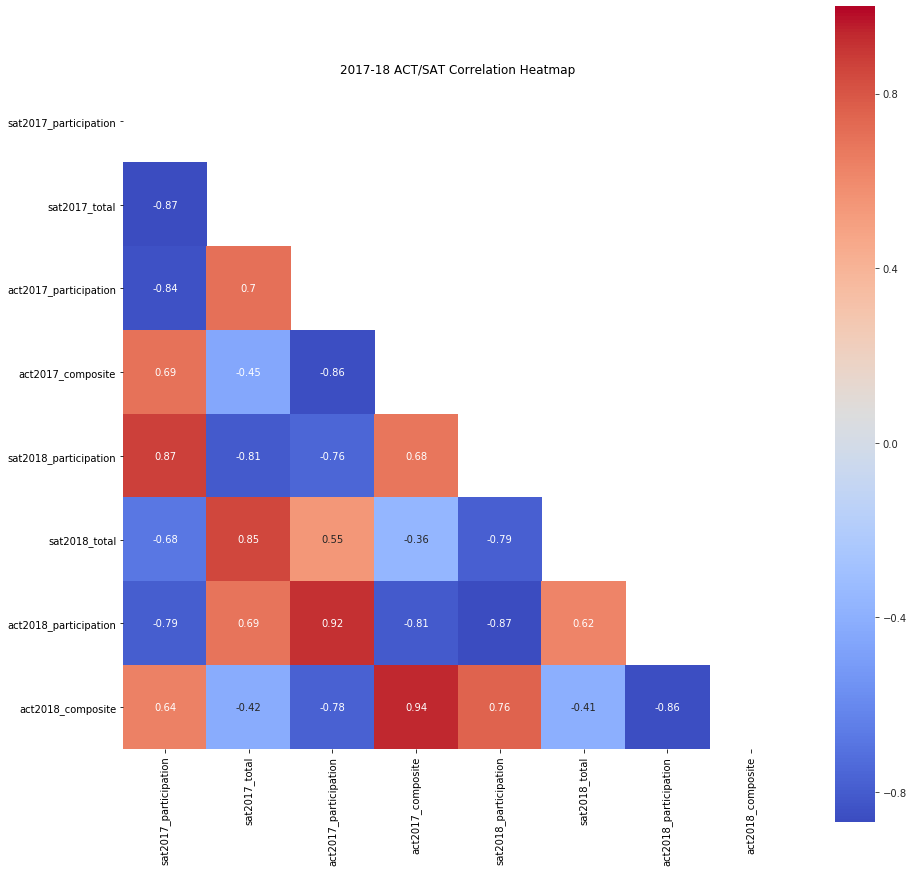

In [1370]:
#Drop redundant columns as they are not informative for this part of the analysis
df = final.drop(columns = ['sat2017_reading_writing', 'sat2017_math', 
                      'act2017_english','act2017_math', 'act2017_reading', 'act2017_science',
                      'sat2018_reading_writing','sat2018_math', 'act2018_english', 'act2018_math', 
                      'act2018_reading', 'act2018_science'])
plt.figure(figsize=(15,15))
plt.title('2017-18 ACT/SAT Correlation Heatmap')
mask = np.zeros_like(df.corr(),dtype = np.float64)

mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    sns.heatmap(df.corr(),mask=mask, square=True, annot=True,cmap='coolwarm')


Correlation heatmap should be broken down into participation and total scores to better understand correlation between years and variable.

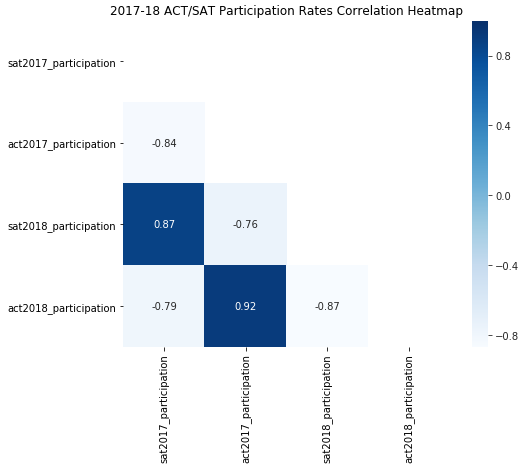

In [1371]:
plt.figure(figsize=(8,6))
plt.title('2017-18 ACT/SAT Participation Rates Correlation Heatmap')
participation_rates = ['sat2017_participation','act2017_participation','sat2018_participation','act2018_participation']
mask = np.zeros_like(df[participation_rates].corr(),dtype = np.float64)

mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    sns.heatmap(df[participation_rates].corr(),mask=mask, square=True, annot=True,cmap='Blues')

For both the SAT and ACT tests, participation rates across 2017 and 2018 has a strong positive correlation with each other. However it is not a perfect positive correlation (+1) and this may be because there have been some states that has had lower participation rates in 2018 compared to 2017, as we have observed above.

There is also a fairly strong negative correlation between SAT and ACT tests within years (e.g. SAT 2017 vs ACT 2017), which may potentially be due to ACT students switching to SAT and vice versa.

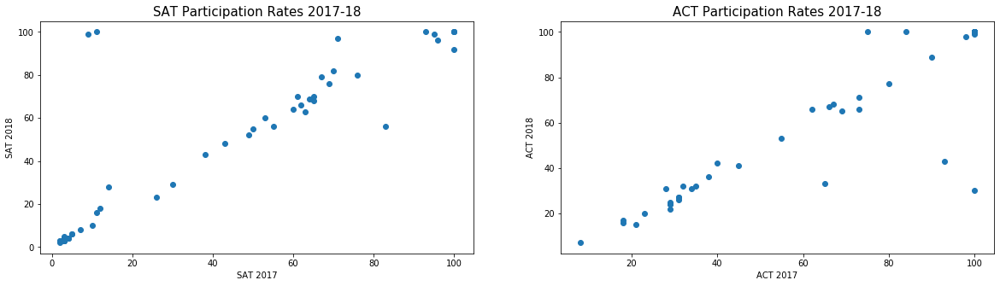

In [1372]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))
plt.subplot(1,2,1)
plt.scatter(final['sat2017_participation'],
           final['sat2018_participation'])

plt.title('SAT Participation Rates 2017-18', fontsize=15)
plt.xlabel('SAT 2017', fontsize=10)
plt.ylabel('SAT 2018',fontsize=10);

plt.subplot(1,2,2)
plt.scatter(final['act2017_participation'],
           final['act2018_participation'])

plt.title('ACT Participation Rates 2017-18', fontsize=15)
plt.xlabel('ACT 2017', fontsize=10)
plt.ylabel('ACT 2018',fontsize=10);

States that have performed well in 2017 have also mostly performed well in 2018 for both ACT and SATs, except for some outlier states.

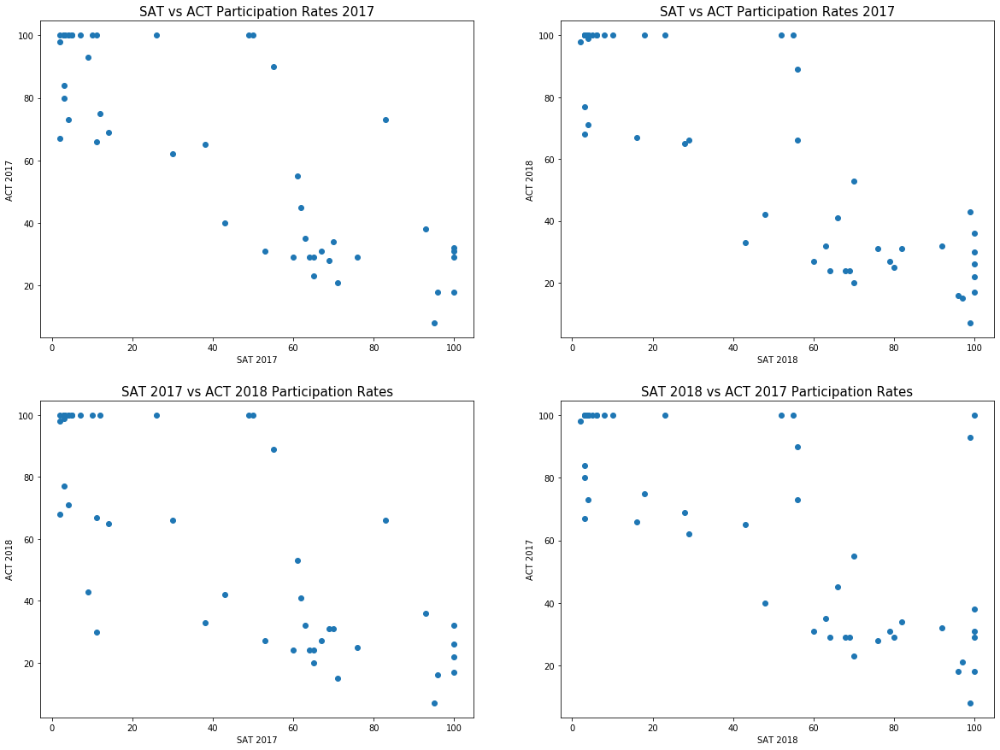

In [1373]:
fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (20,15))
plt.subplot(2,2,1)
plt.scatter(final['sat2017_participation'],
           final['act2017_participation'])

plt.title('SAT vs ACT Participation Rates 2017', fontsize=15)
plt.xlabel('SAT 2017', fontsize=10)
plt.ylabel('ACT 2017',fontsize=10);

plt.subplot(2,2,2)
plt.scatter(final['sat2018_participation'],
           final['act2018_participation'])

plt.title('SAT vs ACT Participation Rates 2017', fontsize=15)
plt.xlabel('SAT 2018', fontsize=10)
plt.ylabel('ACT 2018',fontsize=10);

plt.subplot(2,2,3)
plt.scatter(final['sat2017_participation'],
           final['act2018_participation'])

plt.title('SAT 2017 vs ACT 2018 Participation Rates', fontsize=15)
plt.xlabel('SAT 2017', fontsize=10)
plt.ylabel('ACT 2018',fontsize=10);

plt.subplot(2,2,4)
plt.scatter(final['sat2018_participation'],
           final['act2017_participation'])

plt.title('SAT 2018 vs ACT 2017 Participation Rates', fontsize=15)
plt.xlabel('SAT 2018', fontsize=10)
plt.ylabel('ACT 2017',fontsize=10);

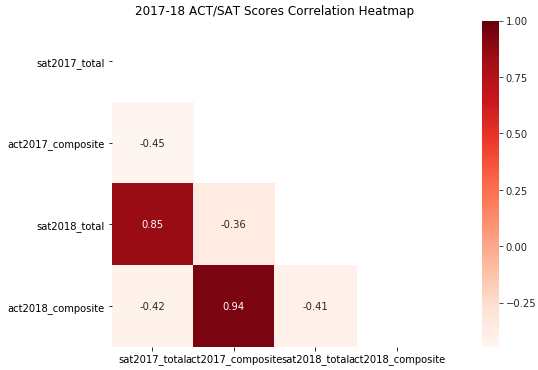

In [1374]:
plt.figure(figsize=(16,6))
plt.title('2017-18 ACT/SAT Scores Correlation Heatmap')
test_scores = ['sat2017_total','act2017_composite','sat2018_total','act2018_composite']
mask = np.zeros_like(df[test_scores].corr(),dtype = np.float64)

mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    sns.heatmap(df[test_scores].corr(),mask=mask, square=True, annot=True,cmap='Reds')

Similar to participation rates, there is a strong positive correlation between years for both SAT and ACT tests, however it is not a perfect correlation - which may be a result of some states that have had declining scores (particularly for SAT given the lower correlation relatively). 

There is a weak correlation between test scores.

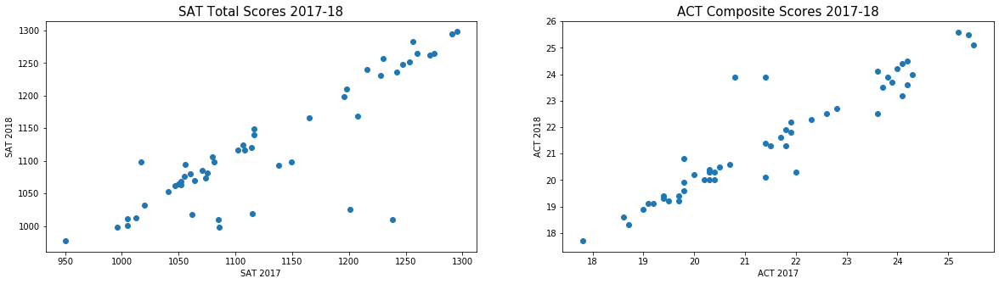

In [1375]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))
plt.subplot(1,2,1)
plt.scatter(final['sat2017_total'],
           final['sat2018_total'])

plt.title('SAT Total Scores 2017-18', fontsize=15)
plt.xlabel('SAT 2017', fontsize=10)
plt.ylabel('SAT 2018',fontsize=10);

plt.subplot(1,2,2)
plt.scatter(final['act2017_composite'],
           final['act2018_composite'])

plt.title('ACT Composite Scores 2017-18', fontsize=15)
plt.xlabel('ACT 2017', fontsize=10)
plt.ylabel('ACT 2018',fontsize=10);

#### Define a custom function to subplot histograms

We have data for two tests for two years. We only have composite (and not subtest scores) for the 2018 ACT. We should write a function that will take the names of 2+ columns and subplot histograms. While you can use pandas plotting or Seaborn here, matplotlib gives you greater control over all aspects of your plots.

[Helpful Link for Plotting Multiple Figures](https://matplotlib.org/users/pyplot_tutorial.html#working-with-multiple-figures-and-axes)

Here's some starter code:

In [1376]:
def subplot_histograms(dataframe, list_of_columns, list_of_titles, list_of_xlabels, width, height):
    nrows = int(np.ceil(len(list_of_columns)/2)) # Makes sure you have enough rows
    fig, ax = plt.subplots(nrows=nrows, ncols=2, figsize = (width,height),sharey=True, sharex=True) # You'll want to specify your figsize
    ax = ax.ravel() # Ravel turns a matrix into a vector, which is easier to iterate
    for i, column in enumerate(list_of_columns): # Gives us an index value to get into all our lists
        ax[i].hist(dataframe[column]) # feel free to add more settings
        ax[i].set_title(list_of_titles[i])# Set titles, labels, etc here for each subplot
        ax[i].set_xlabel(list_of_xlabels[0])
        ax[i].set_ylabel(list_of_xlabels[1])
        

#### Plot and interpret histograms 
For each of the following:
- Participation rates for SAT & ACT
- Math scores for SAT & ACT
- Reading/verbal scores for SAT & ACT

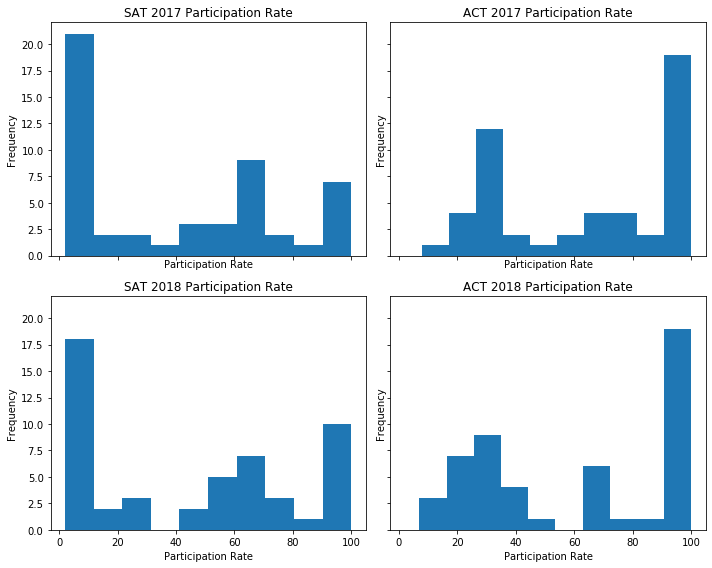

In [1377]:
# Code
list_of_columns = participation_rates
list_of_titles = ['SAT 2017 Participation Rate','ACT 2017 Participation Rate','SAT 2018 Participation Rate','ACT 2018 Participation Rate',]
list_of_xlabels = ['Participation Rate','Frequency']


subplot_histograms(df, list_of_columns, list_of_titles, list_of_xlabels,width=10,height=8)
plt.tight_layout()

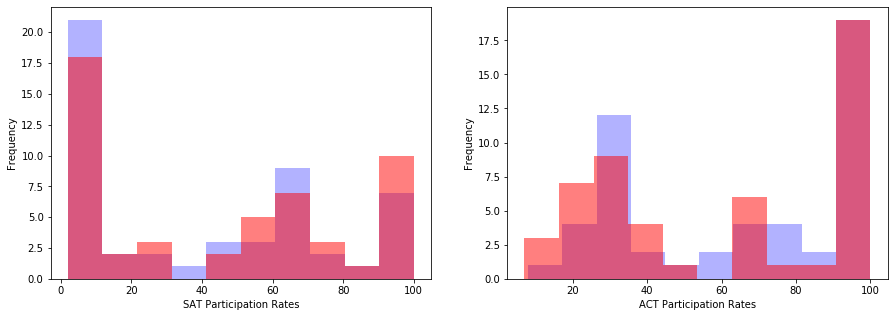

In [1378]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15,5))
plt.subplot(1,2,1)
plt.hist(final['sat2017_participation'], bins = 10, color='b', alpha = 0.3)
plt.hist(final['sat2018_participation'], bins = 10, color='r', alpha = 0.5)
plt.xlabel("SAT Participation Rates") # (x,y)
plt.ylabel("Frequency"); # (x,y)

plt.subplot(1,2,2)
plt.hist(final['act2017_participation'], bins = 10, color='b', alpha = 0.3)
plt.hist(final['act2018_participation'], bins = 10, color='r', alpha = 0.5)
plt.xlabel("ACT Participation Rates") # (x,y)
plt.ylabel("Frequency"); # (x,y)

There has been an improvement in SAT participation rates, as there is a lower frequency at the lower participation levels (0-20% bin) and a shift towards the right. However there has been a slight decrease for ACT participation rates, with a higher frequency in the lower bins when comparing 2017-18.

This suggests that there may have been a shift in participants from the ACT to SAT test.

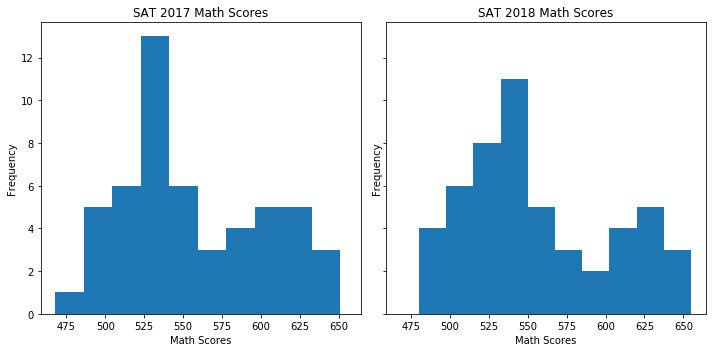

In [1379]:
list_of_columns = ['sat2017_math','sat2018_math']
list_of_titles = ['SAT 2017 Math Scores','SAT 2018 Math Scores',]
list_of_xlabels = ['Math Scores','Frequency']

subplot_histograms(final, list_of_columns, list_of_titles, list_of_xlabels,width=10,height=5)
plt.tight_layout()

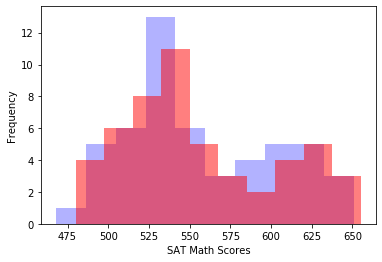

In [1380]:
plt.hist(final['sat2017_math'], bins = 10, color='b', alpha = 0.3)
plt.hist(final['sat2018_math'], bins = 10, color='r', alpha = 0.5)
plt.xlabel("SAT Math Scores") # (x,y)
plt.ylabel("Frequency"); # (x,y)

SAT Math scores seem to have worsen slightly over the 2017-18 period, with a lower frequency in the higher score bins (e.g. in the 575-625 range)

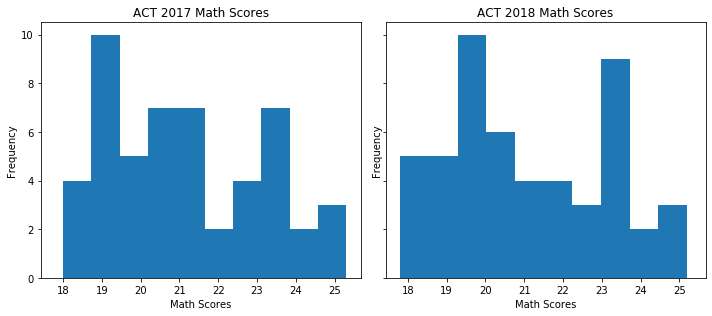

In [1381]:
list_of_columns = ['act2017_math','act2018_math']
list_of_titles = ['ACT 2017 Math Scores','ACT 2018 Math Scores']
list_of_xlabels = ['Math Scores','Frequency']

subplot_histograms(final, list_of_columns, list_of_titles, list_of_xlabels,width=10,height=4.5)
plt.tight_layout()

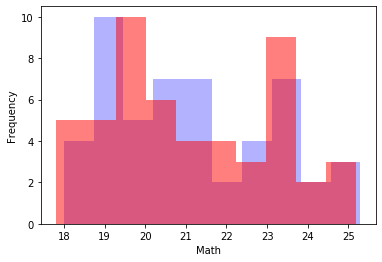

In [1382]:
plt.hist(final['act2017_math'], bins = 10, color='b', alpha = 0.3)
plt.hist(final['act2018_math'], bins = 10, color='r', alpha = 0.5)
plt.xlabel("Math") # (x,y)
plt.ylabel("Frequency"); # (x,y)

ACT Maths scores on the other hand show a slight improvement, with the left hand side slightly flattening out and being distributed towards the higher score ranges.

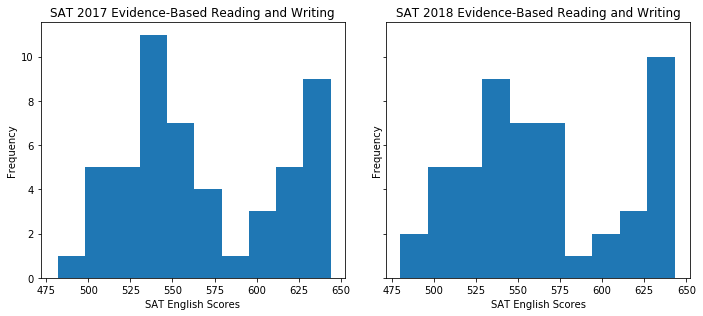

In [1383]:
list_of_columns = ['sat2017_reading_writing','sat2018_reading_writing']
list_of_titles = ['SAT 2017 Evidence-Based Reading and Writing','SAT 2018 Evidence-Based Reading and Writing']
list_of_xlabels = ['SAT English Scores','Frequency']

subplot_histograms(final, list_of_columns, list_of_titles, list_of_xlabels, width=10, height=4.5)
plt.tight_layout()

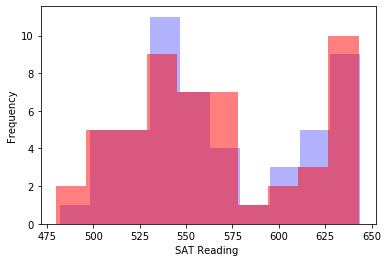

In [1384]:
plt.hist(final['sat2017_reading_writing'], bins = 10, color='b', alpha = 0.3)
plt.hist(final['sat2018_reading_writing'], bins = 10, color='r', alpha = 0.5)
plt.xlabel("SAT Reading ") # (x,y)
plt.ylabel("Frequency"); # (x,y)

Slight worsening of the SAT Reading scores from 2017-18 as there is a lower frequency at the score range of 600+

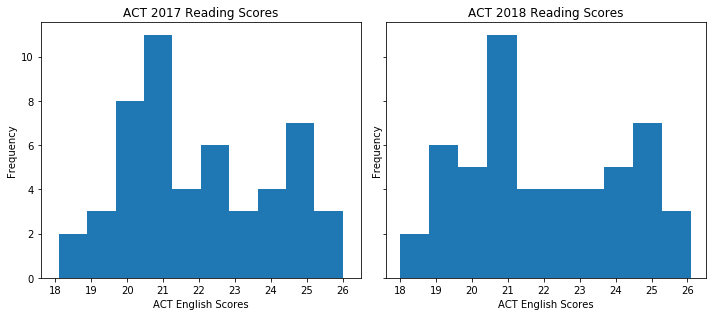

In [1385]:
list_of_columns = ['act2017_reading','act2018_reading']
list_of_titles = ['ACT 2017 Reading Scores','ACT 2018 Reading Scores']
list_of_xlabels = ['ACT English Scores','Frequency']

subplot_histograms(final, list_of_columns, list_of_titles, list_of_xlabels, width=10, height=4.5)
plt.tight_layout()

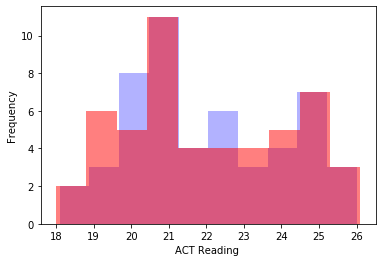

In [1386]:
plt.hist(final['act2017_reading'], bins = 10, color='b', alpha = 0.3)
plt.hist(final['act2018_reading'], bins = 10, color='r', alpha = 0.5)
plt.xlabel("ACT Reading ") # (x,y)
plt.ylabel("Frequency"); # (x,y)

Not too much change in the shape for ACT Reading scores, however there is a slight increase in the lower end bins.

#### Plot and interpret scatter plots

For each of the following:
- SAT vs. ACT math scores for 2017
- SAT vs. ACT verbal/reading scores for 2017
- SAT vs. ACT total/composite scores for 2017
- Total scores for SAT 2017 vs. 2018
- Composite scores for ACT 2017 vs. 2018

Plot the two variables against each other using matplotlib or Seaborn

Your plots should show:
- Two clearly labeled axes
- A proper title
- Using colors and symbols that are clear and unmistakable

**Feel free to write a custom function, and subplot if you'd like.** Functions save both time and space.


## SAT vs ACT scatter plots for Math, Reading and Total/Composite Scores (2017)

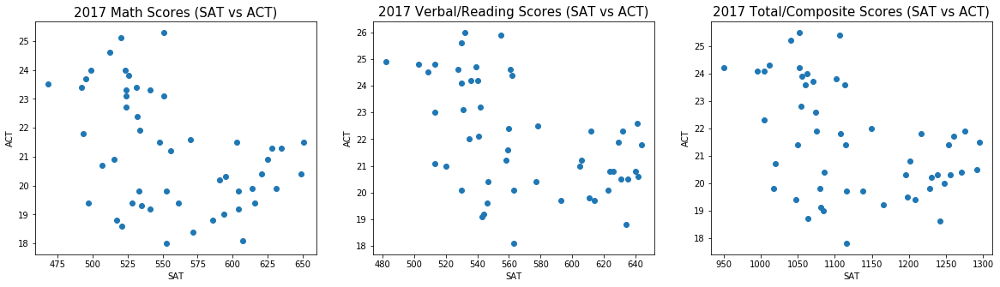

In [1387]:
# Code
fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (20,5))

#SAT vs ACT math scores for 2017
plt.subplot(1,3,1)
plt.scatter(final['sat2017_math'],
           final['act2017_math'])

plt.title('2017 Math Scores (SAT vs ACT)', fontsize=15)
plt.xlabel('SAT', fontsize=10)
plt.ylabel('ACT',fontsize=10);

#SAT vs ACT verbal/reading scores for 2017
plt.subplot(1,3,2)
plt.scatter(final['sat2017_reading_writing'],
           final['act2017_reading'])

plt.title('2017 Verbal/Reading Scores (SAT vs ACT)', fontsize=15)
plt.xlabel('SAT', fontsize=10)
plt.ylabel('ACT',fontsize=10);

#SAT vs ACT total/composite scores for 2017
plt.subplot(1,3,3)
plt.scatter(final['sat2017_total'],
           final['act2017_composite'])

plt.title('2017 Total/Composite Scores (SAT vs ACT)', fontsize=15)
plt.xlabel('SAT', fontsize=10)
plt.ylabel('ACT',fontsize=10);

## 2017 vs 2018 Total/Composite Scores for SAT and ACT

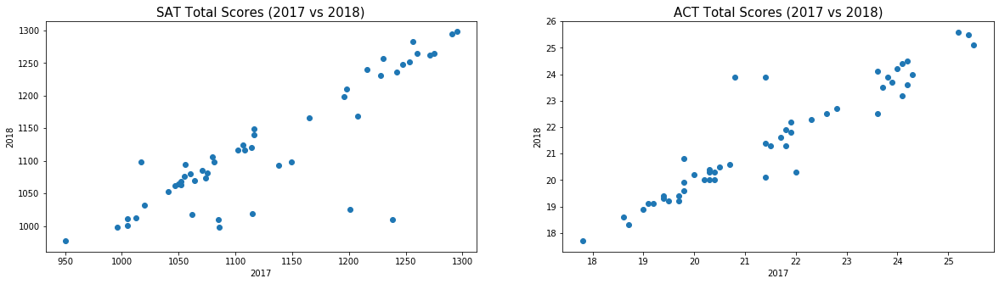

In [1388]:
# Code
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20,5))

#Total Scores for SAT 2017 vs 2018
plt.subplot(1,2,1)
plt.scatter(final['sat2017_total'],
           final['sat2018_total'])

plt.title('SAT Total Scores (2017 vs 2018)', fontsize=15)
plt.xlabel('2017', fontsize=10)
plt.ylabel('2018',fontsize=10);

#Composite Scores for ACT 2017 vs 2018
plt.subplot(1,2,2)
plt.scatter(final['act2017_composite'],
           final['act2018_composite'])

plt.title('ACT Total Scores (2017 vs 2018)', fontsize=15)
plt.xlabel('2017', fontsize=10)
plt.ylabel('2018',fontsize=10);


#### Plot and interpret boxplots

For each numeric variable in the dataframe create a boxplot using Seaborn. Boxplots demonstrate central tendency and spread in variables. In a certain sense, these are somewhat redundant with histograms, but you may be better able to identify clear outliers or differences in IQR, etc.

Multiple values can be plotted to a single boxplot as long as they are of the same relative scale (meaning they have similar min/max values).

Each boxplot should:
- Only include variables of a similar scale
- Have clear labels for each variable
- Have appropriate titles and labels

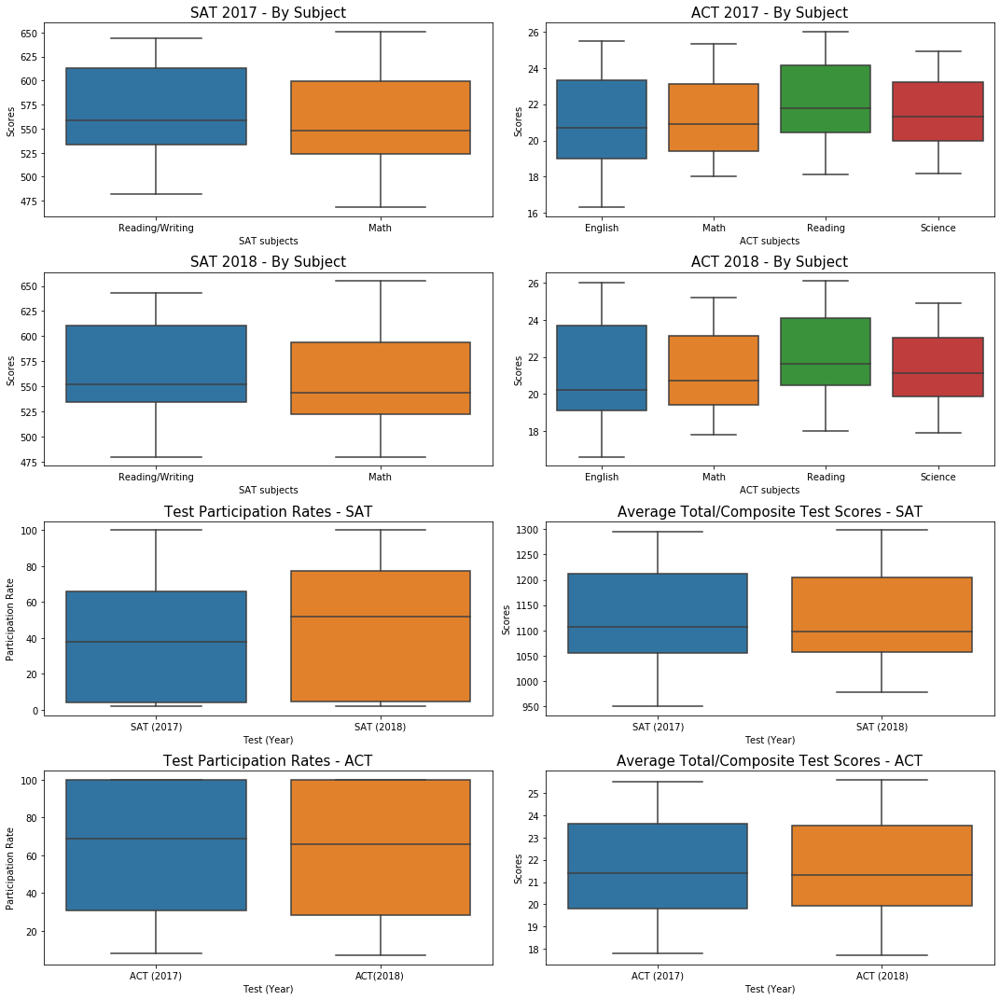

In [1389]:
# Code
fig, ax = plt.subplots(nrows = 4, ncols = 2, figsize = (15,15))


plt.subplot(4,2,1)
sns.boxplot(data=[final['sat2017_reading_writing'],final['sat2017_math']])
plt.title('SAT 2017 - By Subject', fontsize=15)
plt.xlabel('SAT subjects', fontsize=10)
plt.ylabel('Scores',fontsize=10)
plt.xticks([0, 1], ['Reading/Writing', 'Math']);

plt.subplot(4,2,2)
sns.boxplot(data=[final['act2017_english'],final['act2017_math'],final['act2017_reading'],final['act2017_science']])
plt.title('ACT 2017 - By Subject', fontsize=15)
plt.xlabel('ACT subjects', fontsize=10)
plt.ylabel('Scores',fontsize=10)
plt.xticks([0, 1, 2, 3], ['English', 'Math','Reading', 'Science']);

plt.subplot(4,2,3)
sns.boxplot(data=[final['sat2018_reading_writing'],final['sat2018_math']])
plt.title('SAT 2018 - By Subject', fontsize=15)
plt.xlabel('SAT subjects', fontsize=10)
plt.ylabel('Scores',fontsize=10)
plt.xticks([0, 1], ['Reading/Writing', 'Math']);

plt.subplot(4,2,4)
sns.boxplot(data=[final['act2018_english'],final['act2018_math'],final['act2018_reading'],final['act2018_science']])
plt.title('ACT 2018 - By Subject', fontsize=15)
plt.xlabel('ACT subjects', fontsize=10)
plt.ylabel('Scores',fontsize=10)
plt.xticks([0, 1, 2, 3], ['English', 'Math','Reading', 'Science']);

plt.subplot(4,2,5)
sns.boxplot(data=[final['sat2017_participation'],final['sat2018_participation']])
plt.title('Test Participation Rates - SAT', fontsize=15)
plt.xlabel('Test (Year)', fontsize=10)
plt.ylabel('Participation Rate',fontsize=10)
plt.xticks([0, 1,], ['SAT (2017)', 'SAT (2018)']);

plt.subplot(4,2,6)
sns.boxplot(data=[final['sat2017_total'],final['sat2018_total']])
plt.title('Average Total/Composite Test Scores - SAT', fontsize=15)
plt.xlabel('Test (Year)', fontsize=10)
plt.ylabel('Scores',fontsize=10)
plt.xticks([0, 1, ], ['SAT (2017)', 'SAT (2018)']);

plt.subplot(4,2,7)
sns.boxplot(data=[final['act2017_participation'],final['act2018_participation']])
plt.title('Test Participation Rates - ACT', fontsize=15)
plt.xlabel('Test (Year)', fontsize=10)
plt.ylabel('Participation Rate',fontsize=10)
plt.xticks([0, 1,], ['ACT (2017)', 'ACT(2018)']);

plt.subplot(4,2,8)
sns.boxplot(data=[final['act2017_composite'],final['act2018_composite']])
plt.title('Average Total/Composite Test Scores - ACT', fontsize=15)
plt.xlabel('Test (Year)', fontsize=10)
plt.ylabel('Scores',fontsize=10)
plt.xticks([0, 1, ], ['ACT (2017)', 'ACT (2018)']);

plt.tight_layout()

#### Feel free to do additional plots below
*(do research and choose your own chart types & variables)*

Are there any additional trends or relationships you haven't explored? Was there something interesting you saw that you'd like to dive further into? It's likely that there are a few more plots you might want to generate to support your narrative and recommendations that you are building toward. **As always, make sure you're interpreting your plots as you go**.

### Analysing the relationship between household income and participation rates/performance

In [1390]:
hh_income17 = pd.read_csv('data/Household median income 2017.csv')
hh_newcols = {
        'Unnamed: 0':'state',
        'Household Median Income 2017':'hh_income17'
    }
hh_income17.rename(columns=hh_newcols,inplace=True)
final = pd.merge(final,hh_income17,on='state')
final['hh_income17']=final['hh_income17'].map(lambda x:x.replace(',',''))
final['hh_income17'] = final['hh_income17'].astype(float)
final.to_csv('data/final.csv')

In [1391]:
final.dtypes

state                       object
sat2017_participation      float64
sat2017_reading_writing      int64
sat2017_math                 int64
sat2017_total                int64
act2017_participation      float64
act2017_english            float64
act2017_math               float64
act2017_reading            float64
act2017_science            float64
act2017_composite          float64
sat2018_participation      float64
sat2018_reading_writing      int64
sat2018_math                 int64
sat2018_total                int64
act2018_participation      float64
act2018_english            float64
act2018_math               float64
act2018_reading            float64
act2018_science            float64
act2018_composite          float64
hh_income17                float64
dtype: object

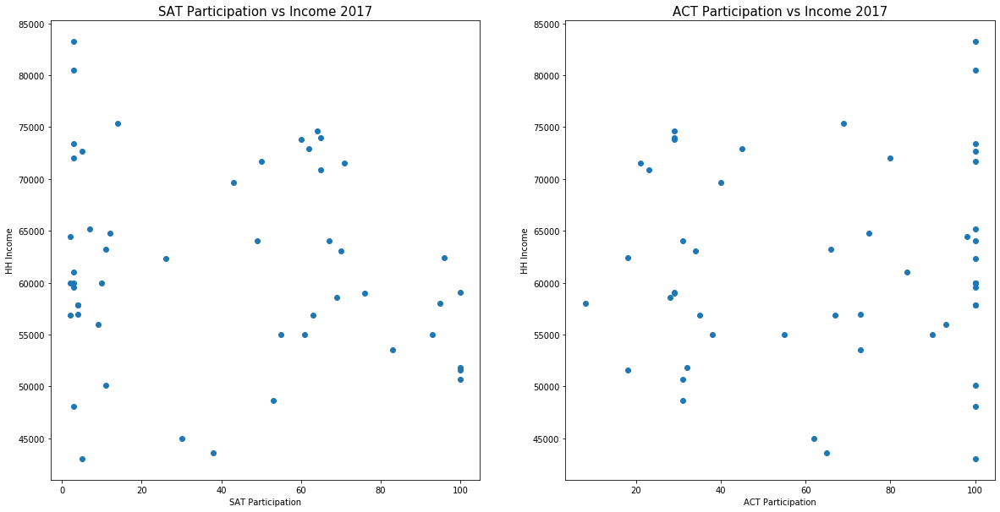

In [1392]:
# Code
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20,10))


#Total Scores for SAT 2017 vs 2018
plt.subplot(1,2,1)
plt.scatter(final['sat2017_participation'],
           final['hh_income17'].sort_values())

plt.title('SAT Participation vs Income 2017', fontsize=15)
plt.xlabel('SAT Participation', fontsize=10)
plt.ylabel('HH Income',fontsize=10);

plt.subplot(1,2,2)
plt.scatter(final['act2017_participation'],
           final['hh_income17'].sort_values())

plt.title('ACT Participation vs Income 2017', fontsize=15)
plt.xlabel('ACT Participation', fontsize=10)
plt.ylabel('HH Income',fontsize=10);



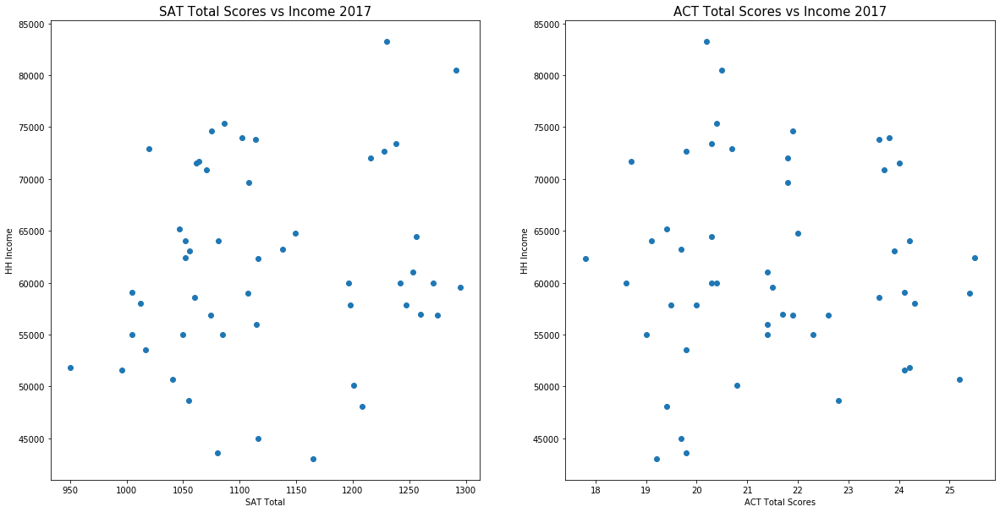

In [1393]:
# Code
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20,10))


#Total Scores for SAT 2017 vs 2018
plt.subplot(1,2,1)
plt.scatter(final['sat2017_total'],
           final['hh_income17'].sort_values())

plt.title('SAT Total Scores vs Income 2017', fontsize=15)
plt.xlabel('SAT Total', fontsize=10)
plt.ylabel('HH Income',fontsize=10);

plt.subplot(1,2,2)
plt.scatter(final['act2017_composite'],
           final['hh_income17'].sort_values())

plt.title('ACT Total Scores vs Income 2017', fontsize=15)
plt.xlabel('ACT Total Scores', fontsize=10)
plt.ylabel('HH Income',fontsize=10);

There is not a strong relationship between median household income and participation rates. The reason for a lack of a correlation may be due to government funding for poorer states which would have pushed up participation rates in those areas. 

There seems to be a slight positive correlation between household income and SAT total scores, however it is less evident for the ACT.

### Analysing the relationship between household ethnicity and participation rates/total scores

In [1394]:
race17 = pd.read_csv('data/USAethnicity.csv')
race_newcols = {'State':'state','Totals':'total',
              'White': 'white',
              'African American': 'african_american',
              'American Indian/ Alaskan Native':'american_indian',
              'Asian':'asian',
              'Native Hawaiian':'native_hawaiian',
              'Two or more races': 'two_or_more'}
race17.rename(columns=race_newcols,inplace=True)
race17.total= race17.total-race17.two_or_more
race17.drop(columns=(['two_or_more']))
race17['percentage_white'] = round(race17.white/race17.total*100)
race17['percentage_asian'] = round(race17.asian/race17.total*100)
race_merge = race17[['state','percentage_white','percentage_asian']]
final = pd.merge(final,race_merge,on='state')
final.head()

,state,sat2017_participation,sat2017_reading_writing,sat2017_math,sat2017_total,act2017_participation,act2017_english,act2017_math,act2017_reading,act2017_science,...,sat2018_total,act2018_participation,act2018_english,act2018_math,act2018_reading,act2018_science,act2018_composite,hh_income17,percentage_white,percentage_asian
0,Alabama,5.0,593,572,1165,100.0,18.9,18.4,19.7,19.4,...,1166,100.0,18.9,18.3,19.6,19.0,19.1,50659.0,71.0,1.0
1,Alaska,38.0,547,533,1080,65.0,18.7,19.8,20.4,19.9,...,1106,33.0,19.8,20.6,21.6,20.7,20.8,72036.0,73.0,5.0
2,Arizona,30.0,563,553,1116,62.0,18.6,19.8,20.1,19.8,...,1149,66.0,18.2,19.4,19.5,19.2,19.2,61000.0,86.0,5.0
3,Arkansas,3.0,614,594,1208,100.0,18.9,19.0,19.7,19.5,...,1169,100.0,19.1,18.9,19.7,19.4,19.4,48667.0,81.0,1.0
4,California,53.0,531,524,1055,31.0,22.5,22.7,23.1,22.2,...,1076,27.0,22.5,22.5,23.0,22.1,22.7,69688.0,76.0,15.0


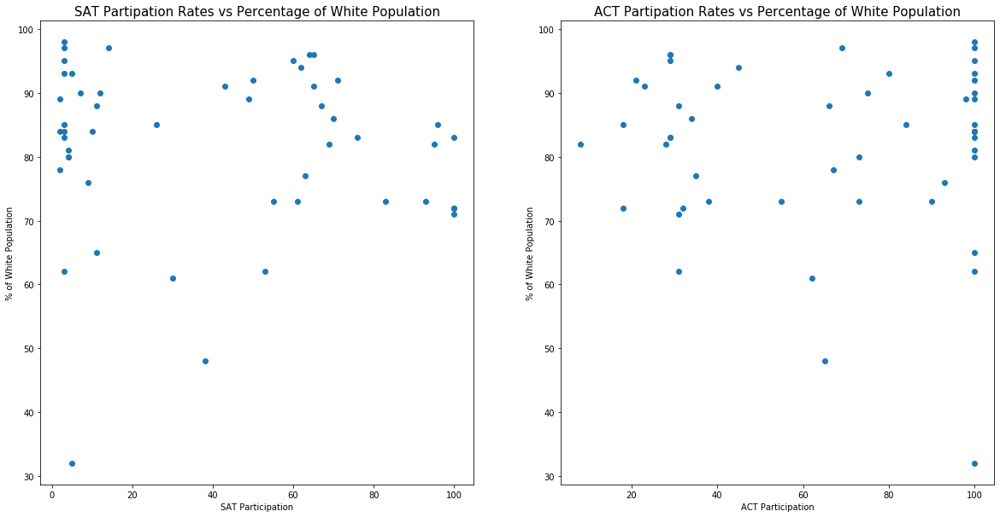

In [1395]:
# Code
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20,10))


plt.subplot(1,2,1)
plt.scatter(final['sat2017_participation'],
           final['percentage_white'].sort_values())

plt.title('SAT Partipation Rates vs Percentage of White Population', fontsize=15)
plt.xlabel('SAT Participation', fontsize=10)
plt.ylabel('% of White Population',fontsize=10);

plt.subplot(1,2,2)
plt.scatter(final['act2017_participation'],
           final['percentage_white'].sort_values())

plt.title('ACT Partipation Rates vs Percentage of White Population', fontsize=15)
plt.xlabel('ACT Participation', fontsize=10)
plt.ylabel('% of White Population',fontsize=10);

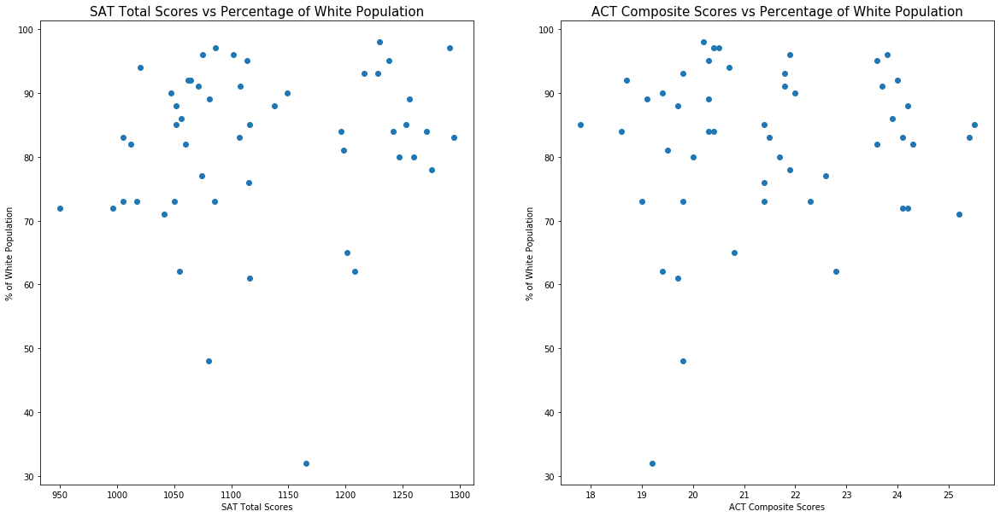

In [1396]:
# Code
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20,10))


plt.subplot(1,2,1)
plt.scatter(final['sat2017_total'],
           final['percentage_white'].sort_values())

plt.title('SAT Total Scores vs Percentage of White Population', fontsize=15)
plt.xlabel('SAT Total Scores', fontsize=10)
plt.ylabel('% of White Population',fontsize=10);

plt.subplot(1,2,2)
plt.scatter(final['act2017_composite'],
           final['percentage_white'].sort_values())

plt.title('ACT Composite Scores vs Percentage of White Population', fontsize=15)
plt.xlabel('ACT Composite Scores', fontsize=10)
plt.ylabel('% of White Population',fontsize=10);

There seems to be a lack of correlation between the ethnicity of households with participation rates or total scores. Maybe better data would be to have the ethnicity of students themselves.

### Analysing the relationship between ethnicity of students vs participation rates and total/composite scores

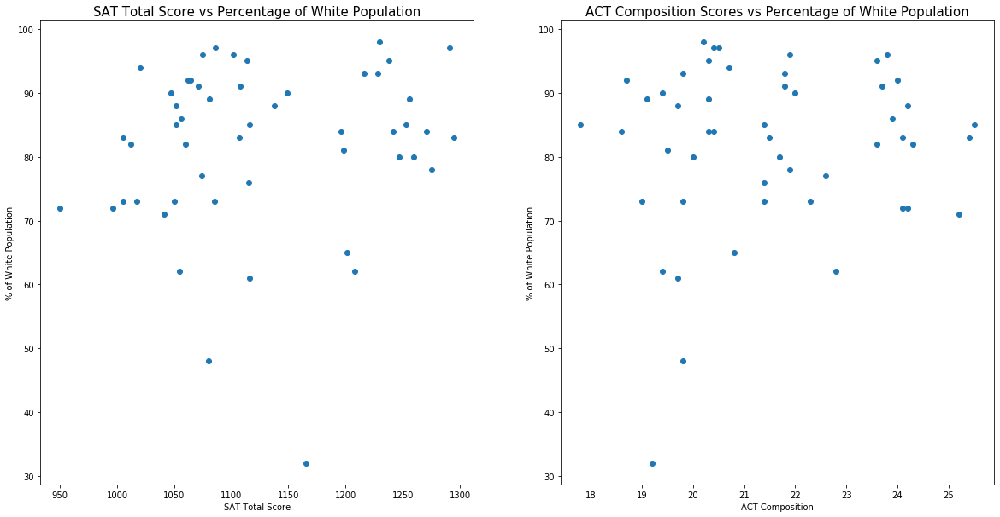

In [1397]:
# Code
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20,10))


plt.subplot(1,2,1)
plt.scatter(final['sat2017_total'],
           final['percentage_white'].sort_values())

plt.title('SAT Total Score vs Percentage of White Population', fontsize=15)
plt.xlabel('SAT Total Score', fontsize=10)
plt.ylabel('% of White Population',fontsize=10);

plt.subplot(1,2,2)
plt.scatter(final['act2017_composite'],
           final['percentage_white'].sort_values())

plt.title('ACT Composition Scores vs Percentage of White Population', fontsize=15)
plt.xlabel('ACT Composition', fontsize=10)
plt.ylabel('% of White Population',fontsize=10);

In [1398]:
race_students18=pd.read_csv('data/Cohort by Ethnicity.csv')
race2_newcols = {'Unnamed: 0':'state',
              'White': 'white',
              'Black/African American': 'african_american',
              'American Indian':'american_indian',
              'Asian':'asian',
              'Native Hawaiian':'native_hawaiian',
                'Hispanic/Latino':'hispanic',
              'Two or more races': 'two_or_more',
               'No response':'no_response',
               'Total Population':'total_popn'}
race_students18.rename(columns=race2_newcols,inplace=True)
race_stud18= race_students18.drop(columns=(['two_or_more','no_response']))
race_stud18['white_students']= race_stud18['white']/race_stud18['total_popn']
race_stud18.dtypes

state                object
american_indian       int64
asian                 int64
african_american      int64
hispanic              int64
native_hawaiian       int64
white                 int64
total_popn            int64
white_students      float64
dtype: object

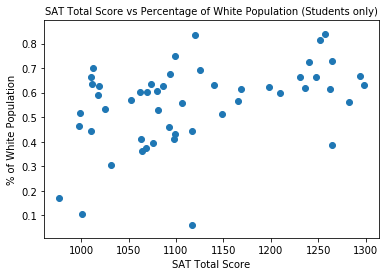

In [1399]:
plt.scatter(final['sat2018_total'],
           race_stud18['white_students'])

plt.title('SAT Total Score vs Percentage of White Population (Students only)', fontsize=10)
plt.xlabel('SAT Total Score', fontsize=10)
plt.ylabel('% of White Population',fontsize=10);

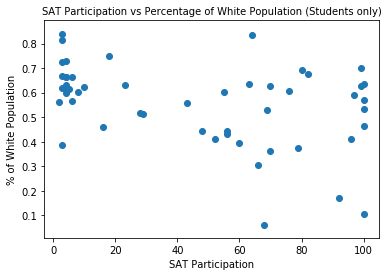

In [1400]:
plt.scatter(final['sat2018_participation'],
           race_stud18['white_students'])

plt.title('SAT Participation vs Percentage of White Population (Students only)', fontsize=10)
plt.xlabel('SAT Participation', fontsize=10)
plt.ylabel('% of White Population',fontsize=10);

It seems that states with a higher population of white ethnicity candidates have performed better at the SATs.

#### (Optional): Using Tableau, create a choropleth map for each variable using a map of the US. 

Save this plot as an image file in an images directory, provide a relative path, and insert the image into notebook in markdown.

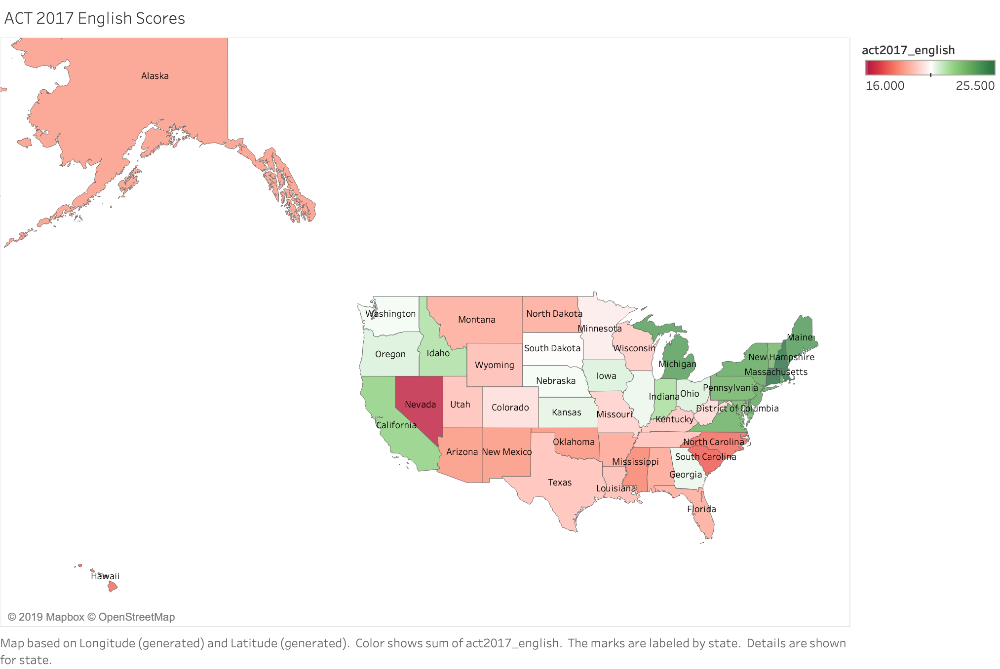

In [1401]:
from IPython.display import Image
Image(filename='png/ACT 2017 Eng.png')

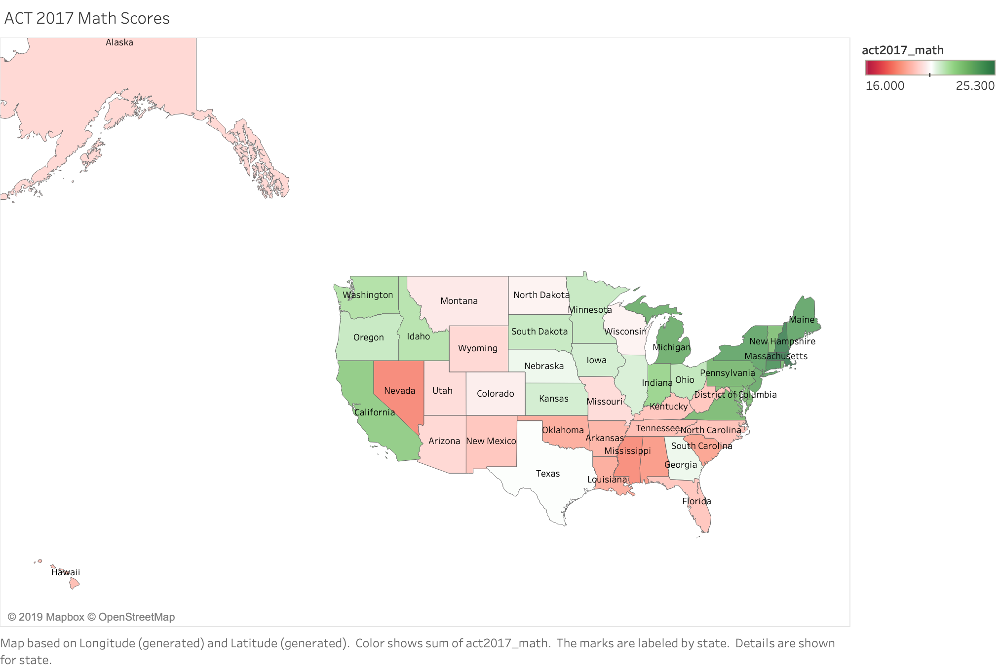

In [1402]:
Image(filename='png/ACT 2017 Math.png')


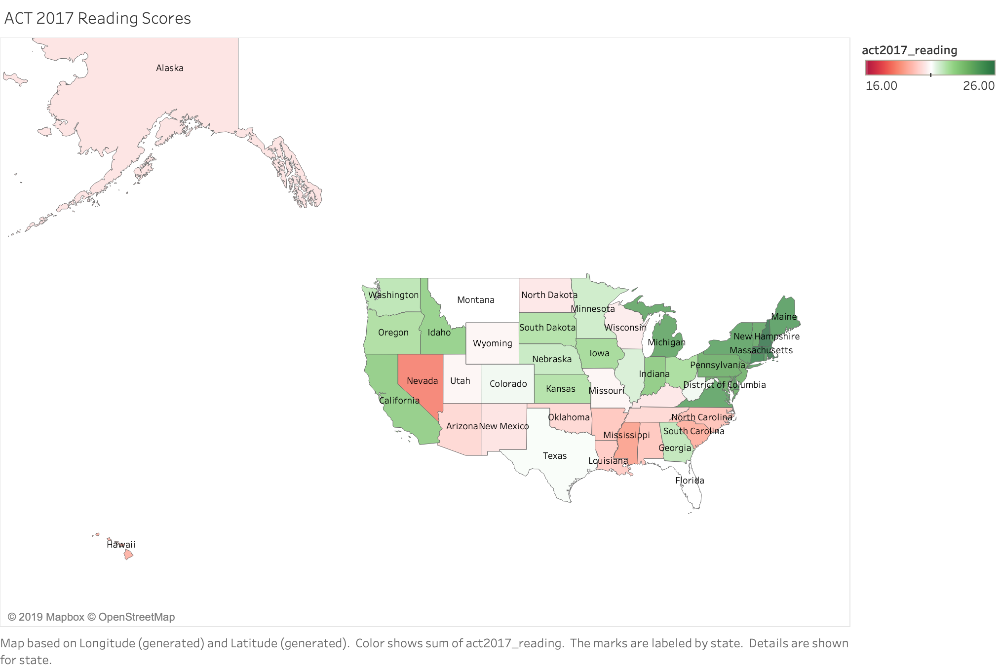

In [1403]:
Image(filename='png/ACT 2017 Reading.png')


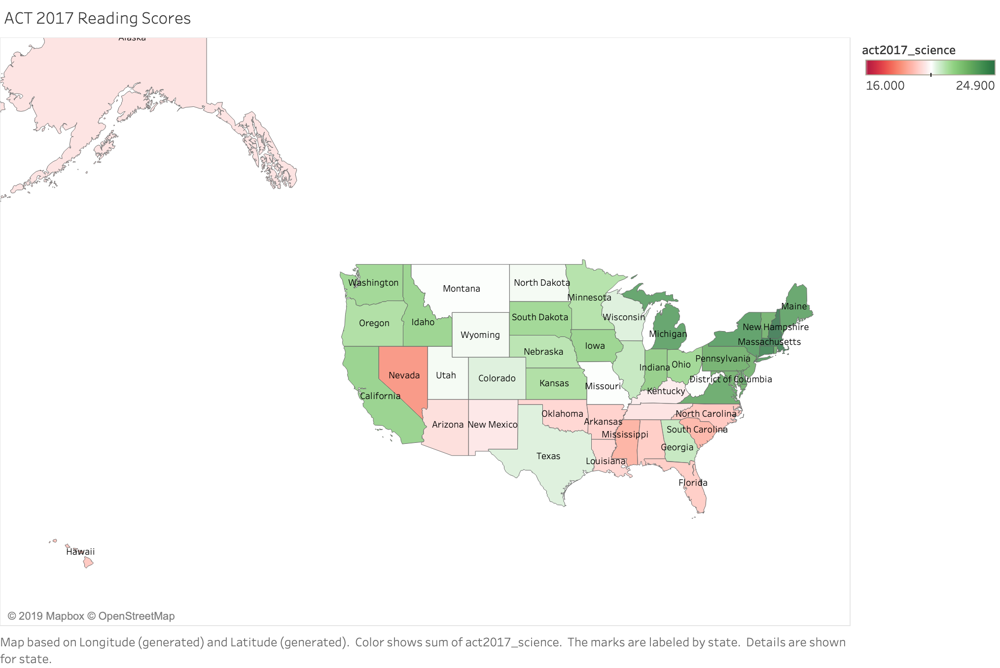

In [1404]:
Image(filename='png/ACT 2017 Science.png')


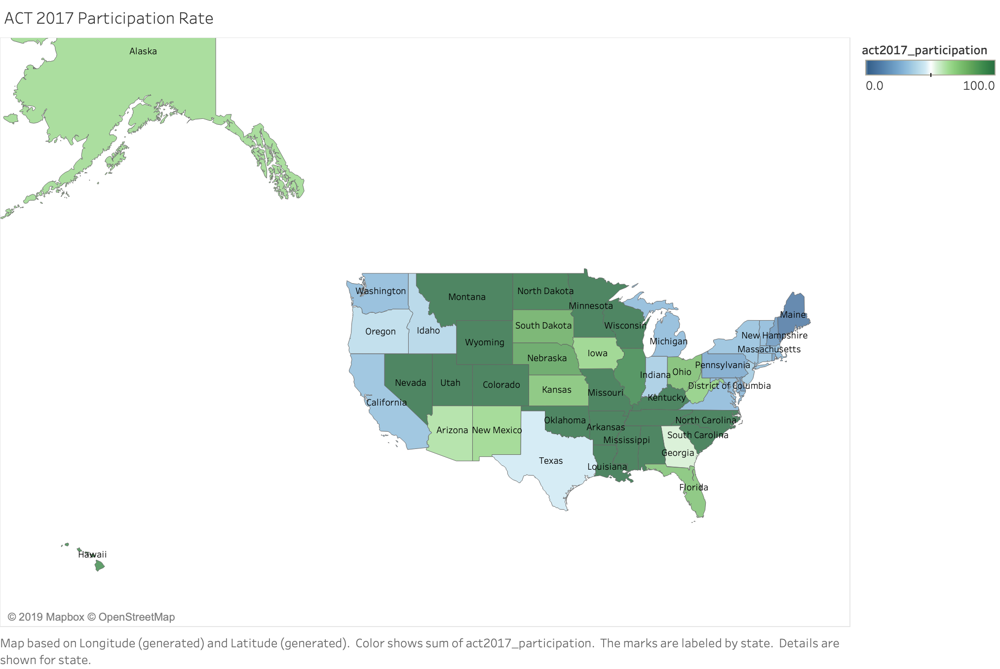

In [1405]:
Image(filename='png/ACT 2017 Participation Rate.png')


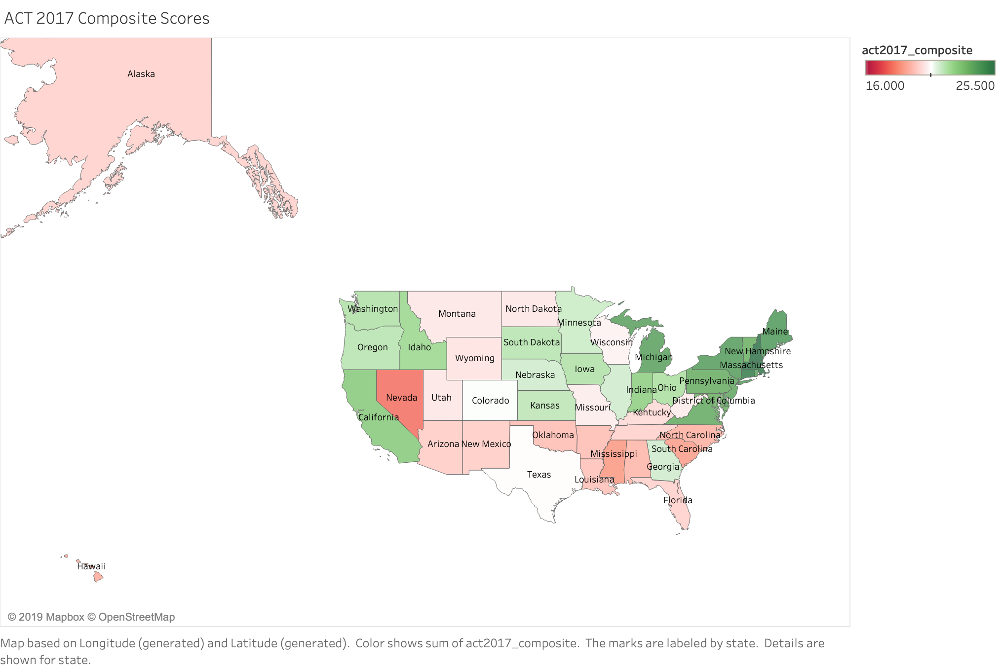

In [1406]:
Image(filename='png/ACT 2017.png')


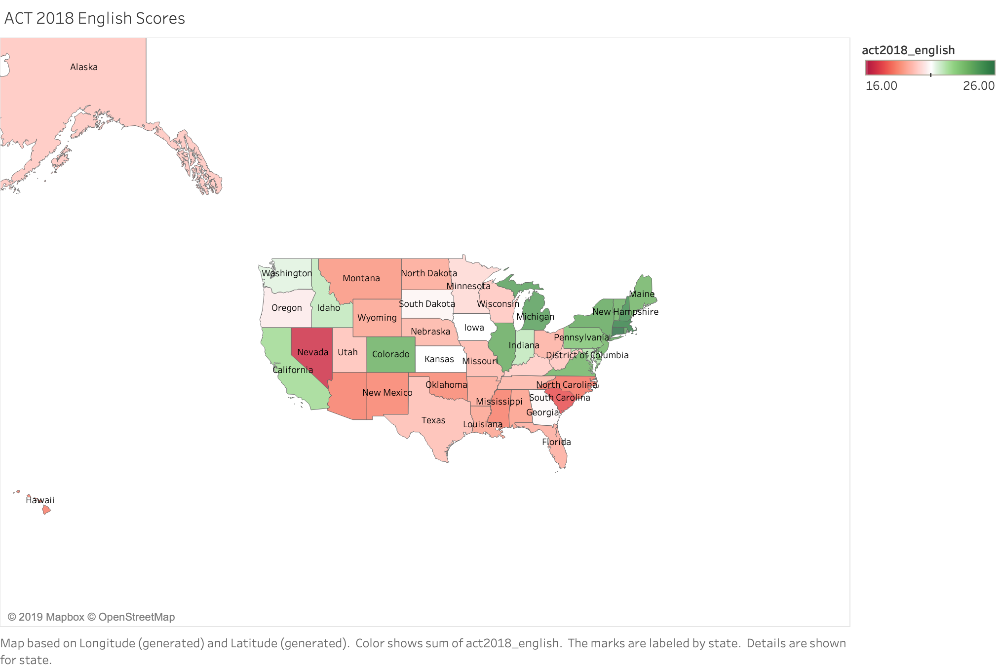

In [1407]:
Image(filename='png/ACT 2018 Eng.png')


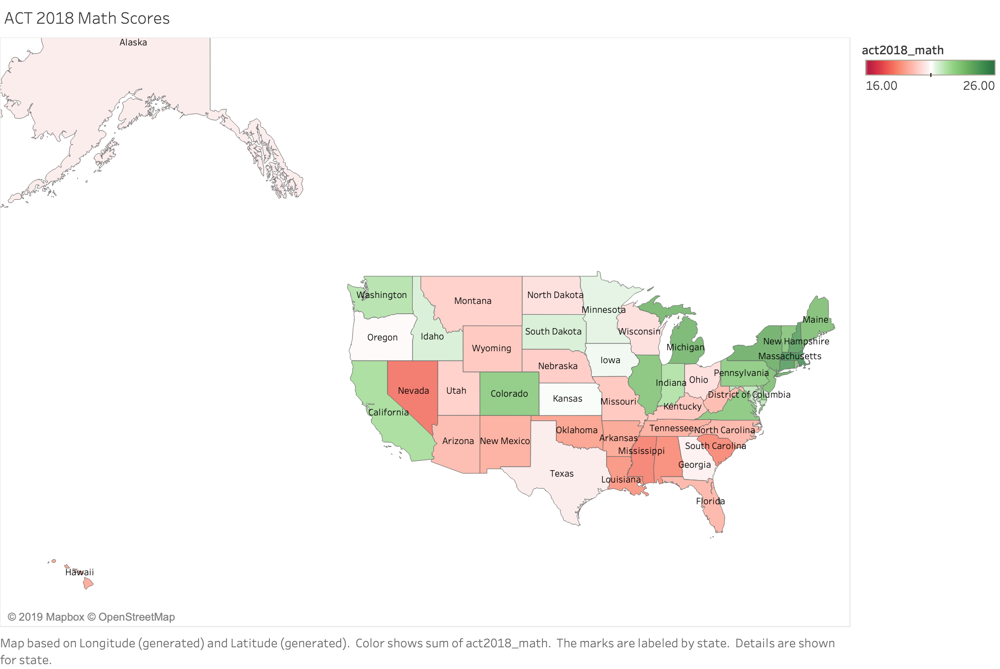

In [1408]:
Image(filename='png/ACT 2018 Math .png')


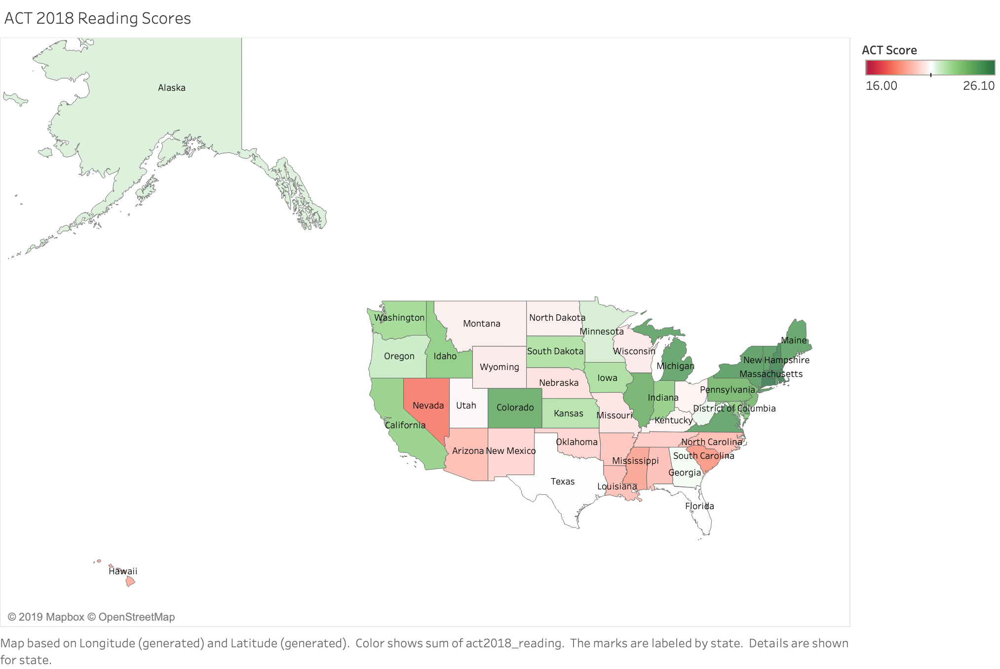

In [1409]:
Image(filename='png/ACT 2018 Reading.png')


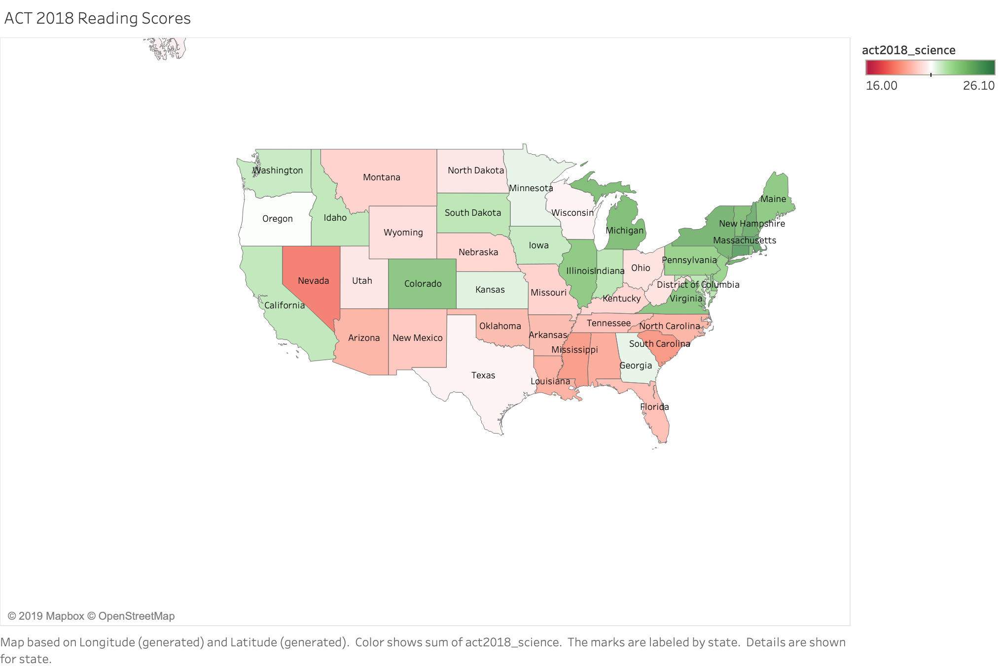

In [1410]:
Image(filename='png/ACT 2018 Science .png')


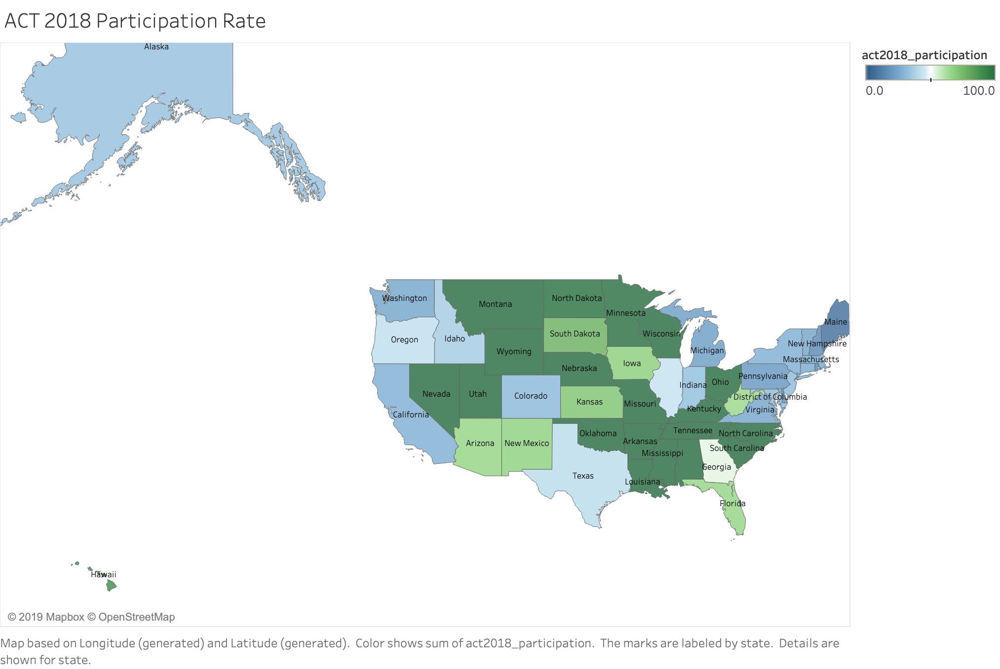

In [1411]:
Image(filename='png/ACT 2018 Participation Rate.png')


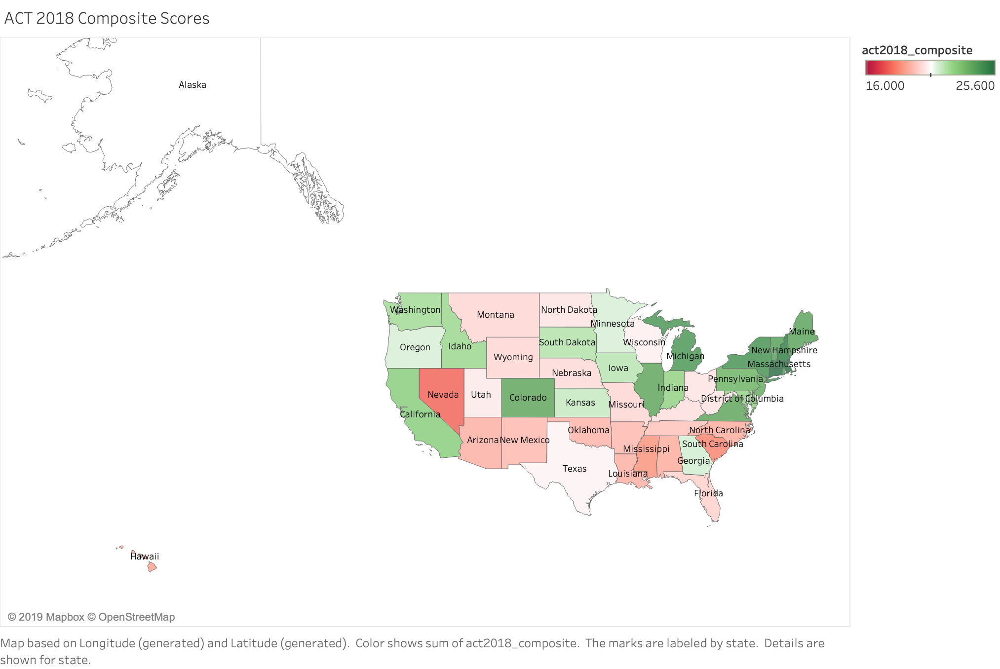

In [1412]:
Image(filename='png/ACT 2018 Composite.png')

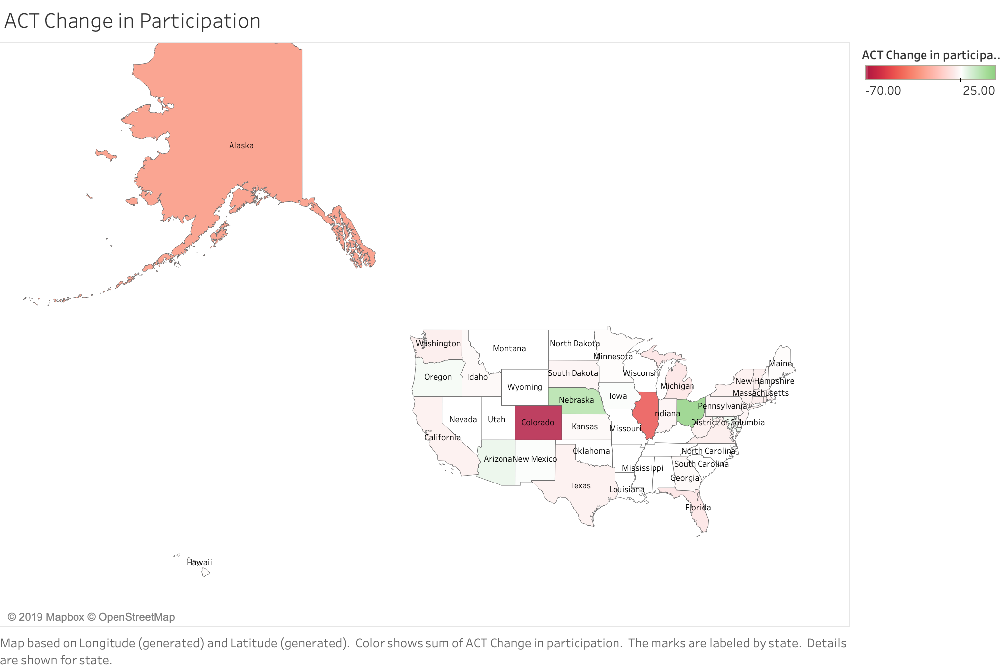

In [1413]:
Image(filename='png/ACT Change in Participation.png')

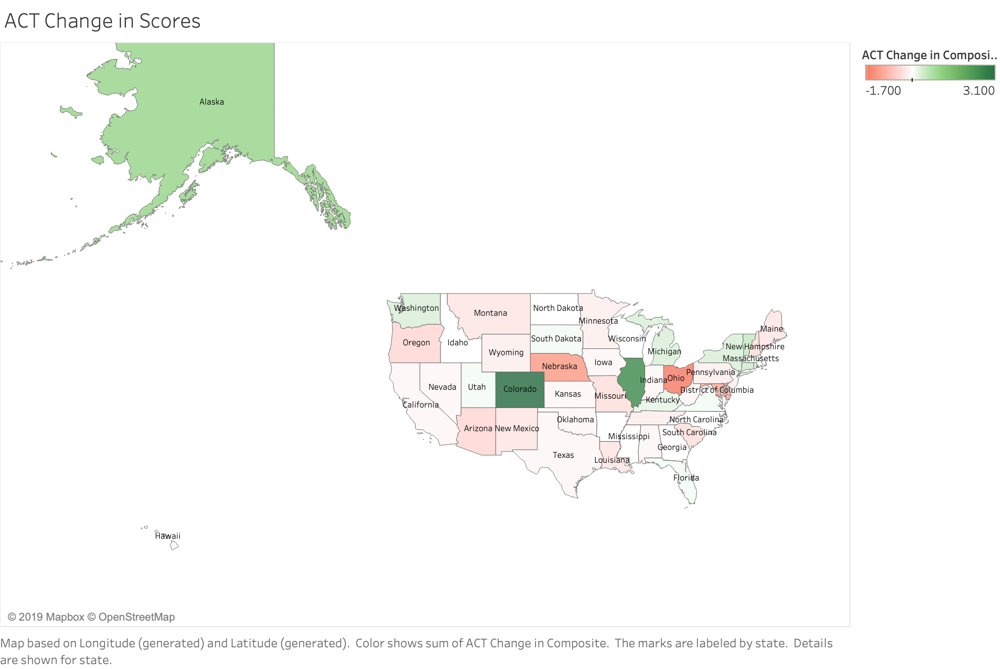

In [1414]:
Image(filename='png/ACT Change in Scores.png')

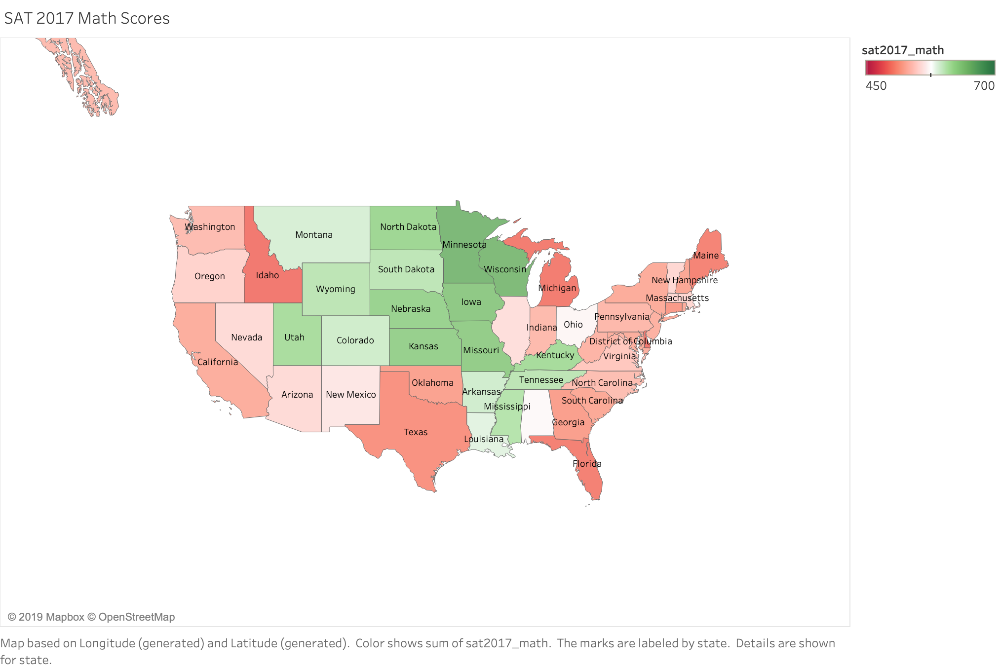

In [1415]:
Image(filename='png/SAT 2017 Math.png')

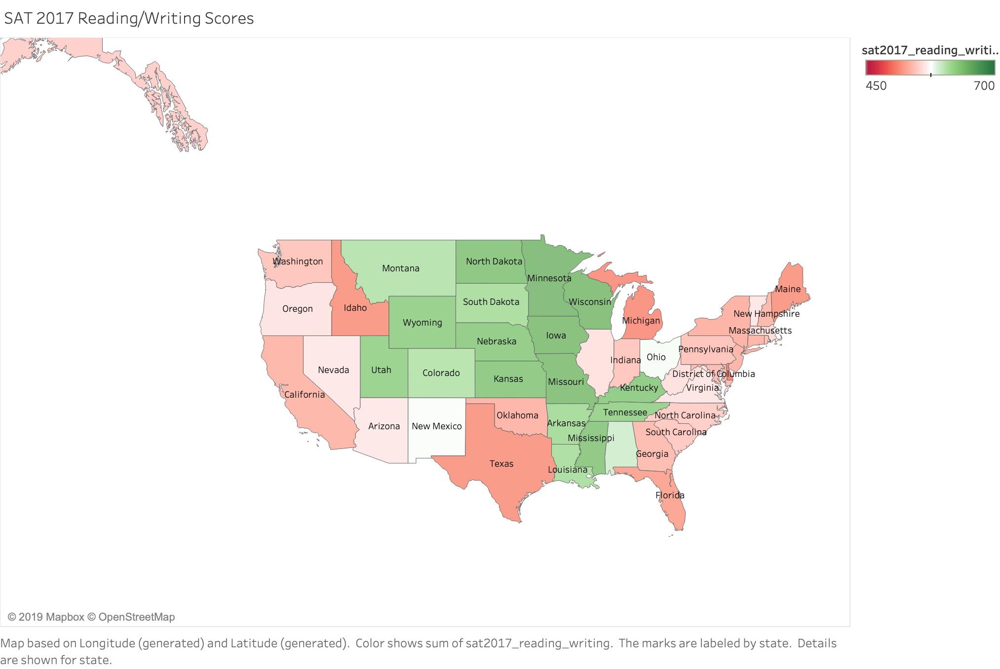

In [1416]:
Image(filename='png/SAT 2017 ReadingWriting.png')

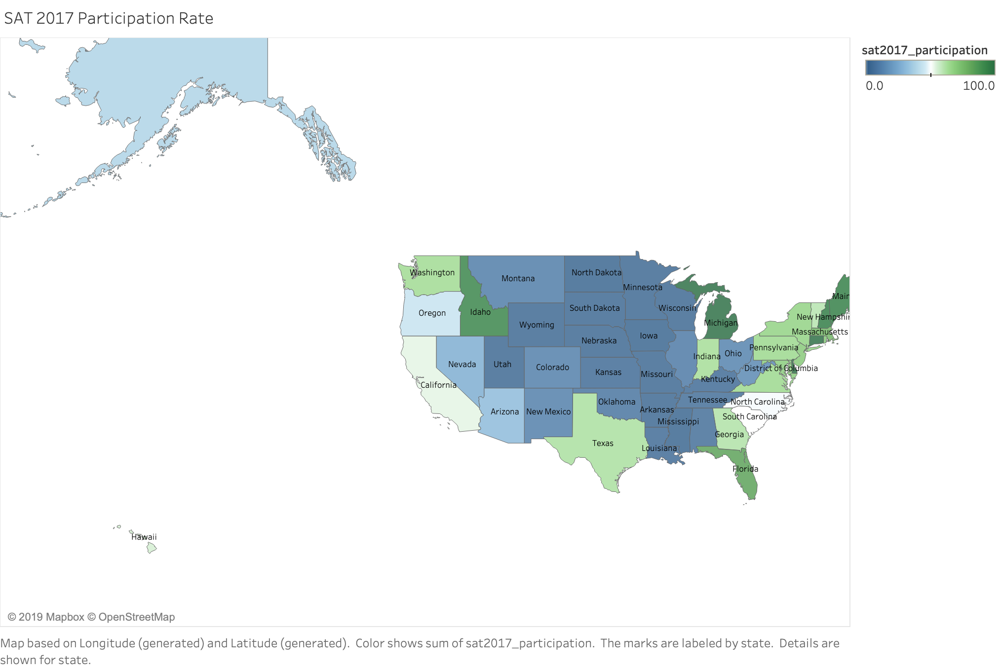

In [1417]:
Image(filename='png/SAT 2017 Participation Rate.png')

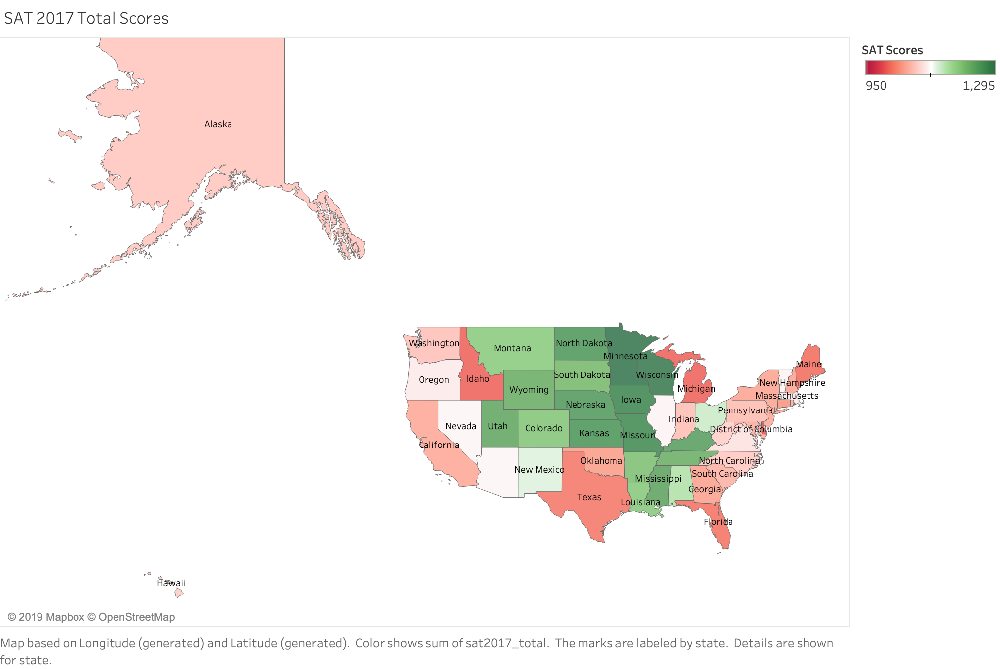

In [1418]:
Image(filename='png/SAT 2017 Total.png')

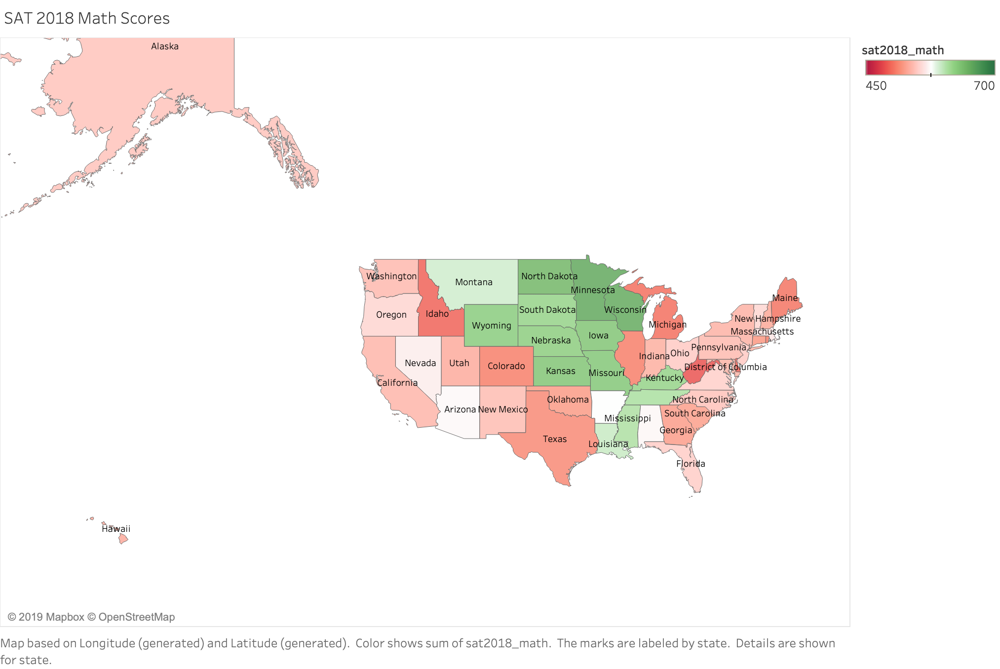

In [1419]:
Image(filename='png/SAT 2018 Math .png')

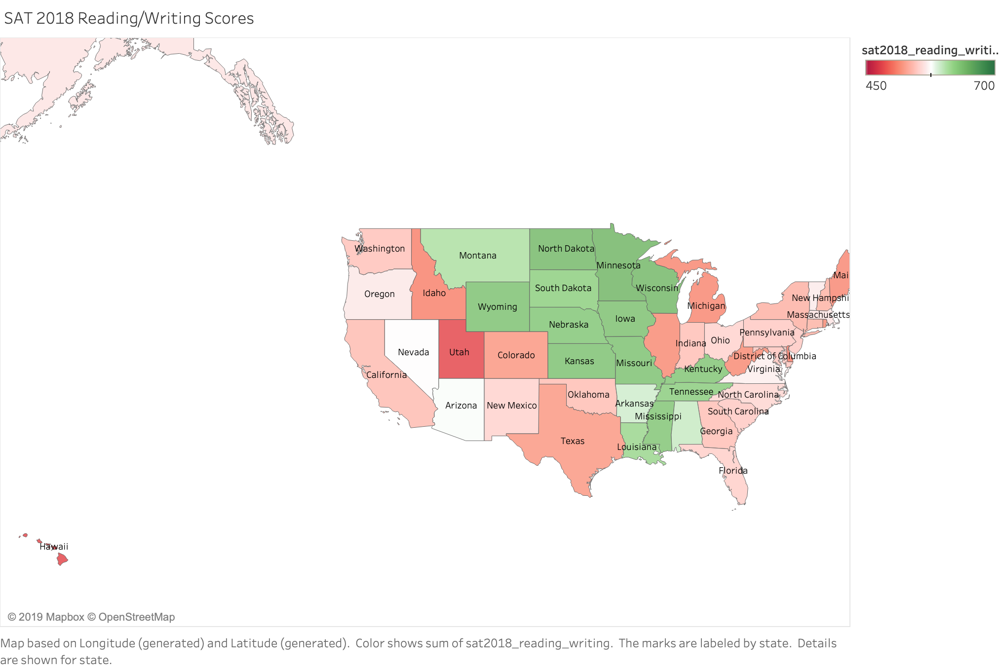

In [1420]:
Image(filename='png/SAT 2018 ReadingWriting .png')

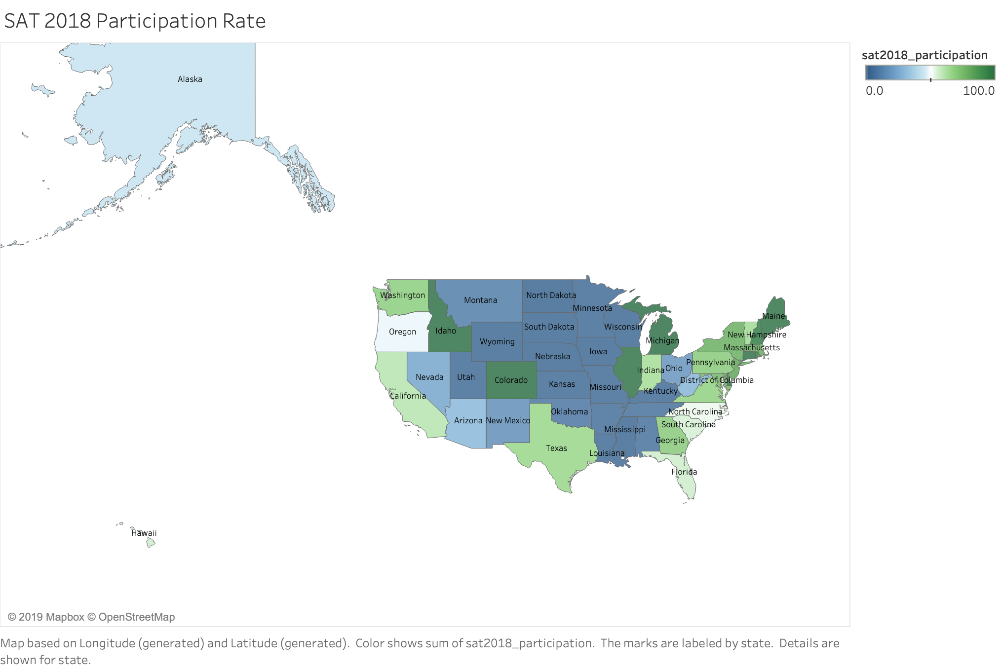

In [1421]:
Image(filename='png/SAT 2018 Participation Rate .png')

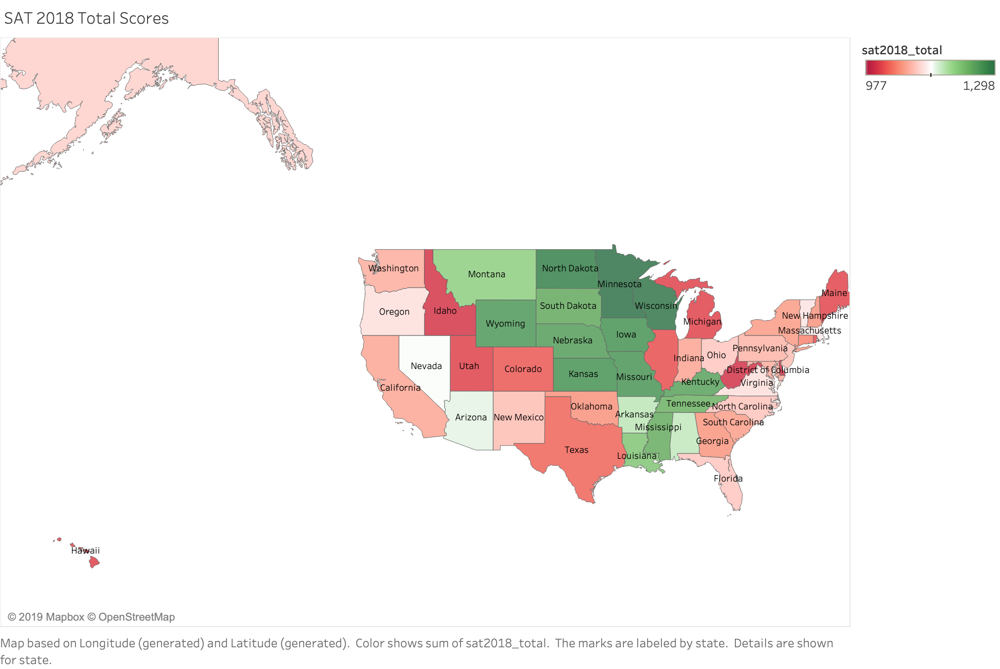

In [1422]:
Image(filename='png/SAT 2018 Total.png')

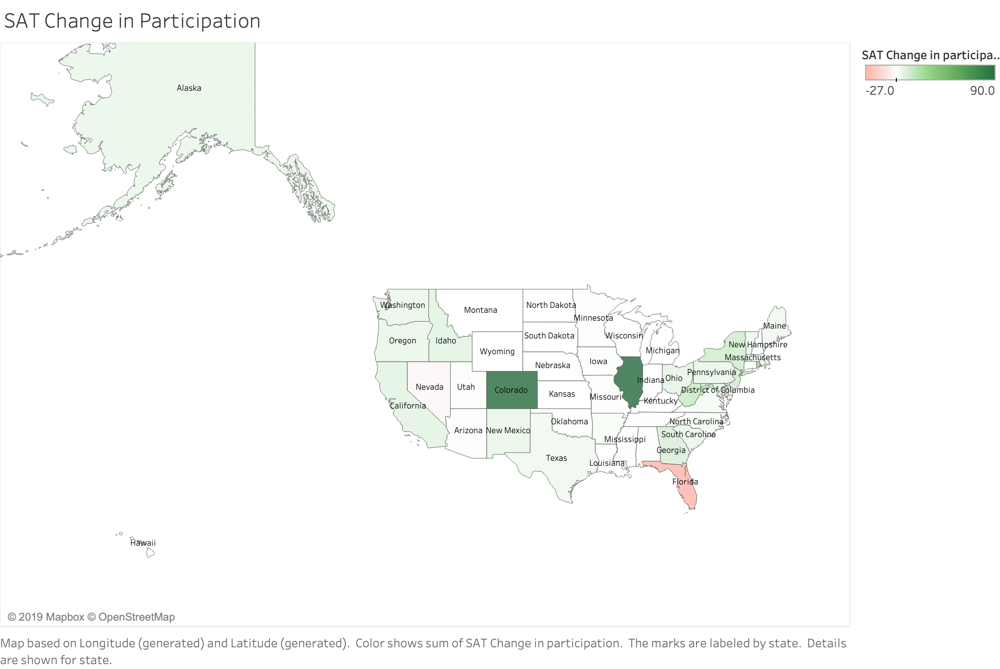

In [1423]:
Image(filename='png/SAT Change in Participation.png')

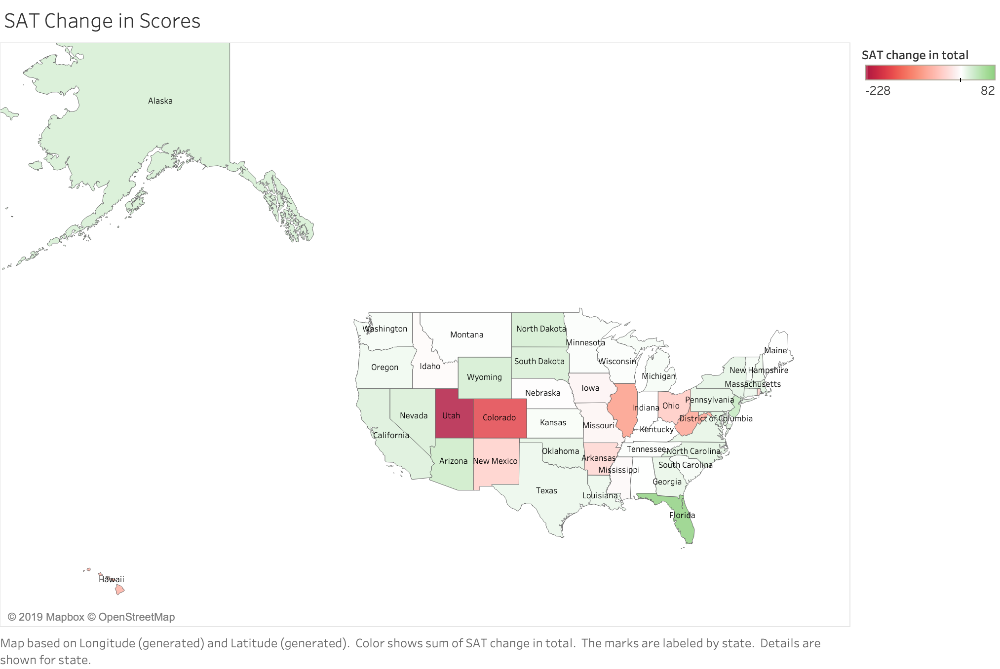

In [1424]:
Image(filename='png/SAT Change in Scores.png')

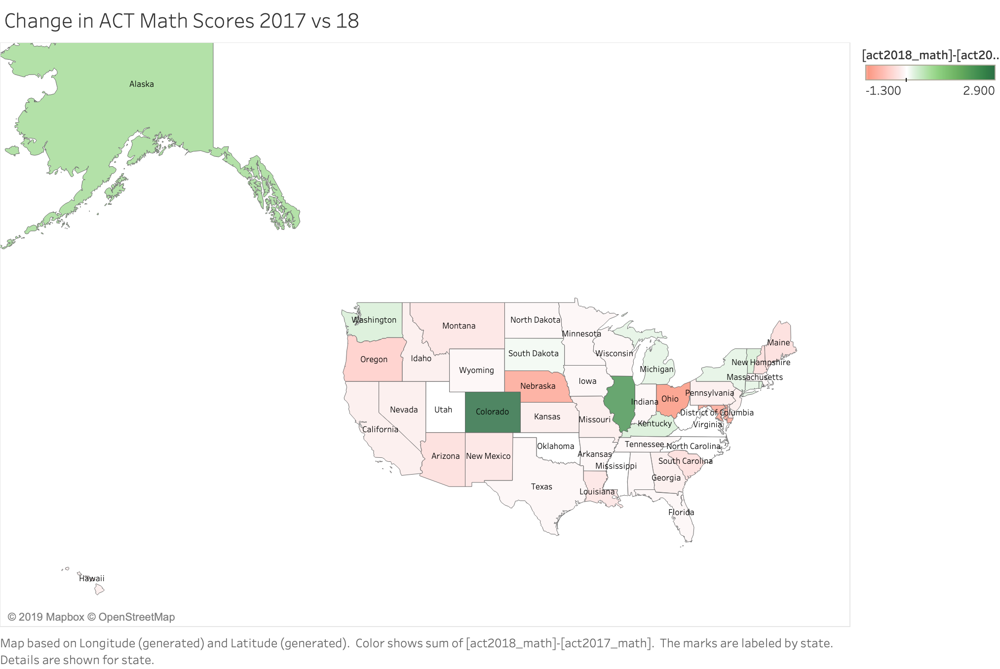

In [1425]:
Image(filename='png/ACT Math%.png')

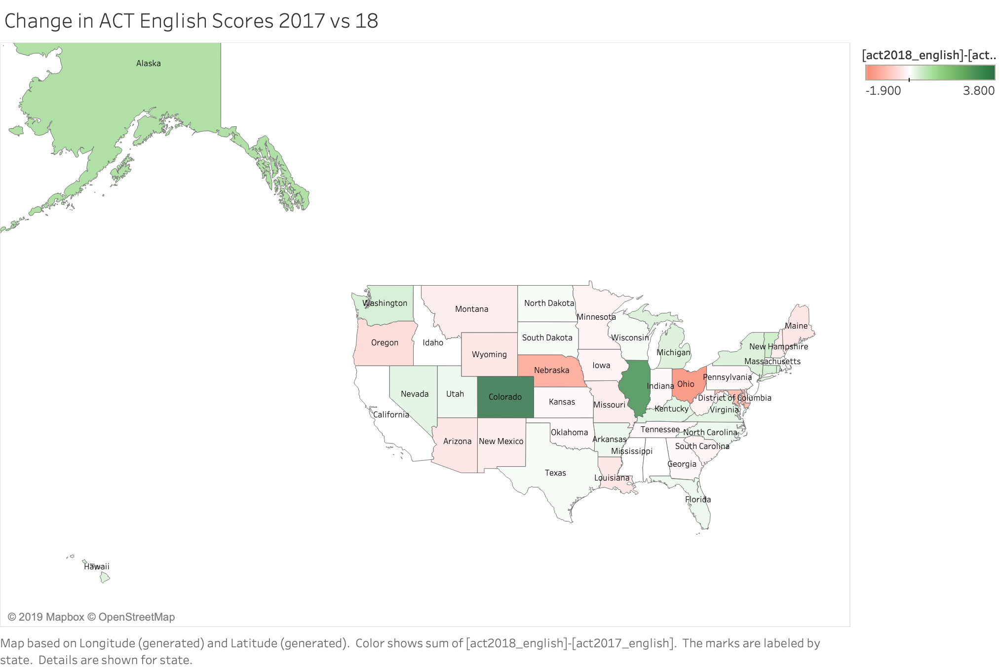

In [1426]:
Image(filename='png/ACT English %.png')

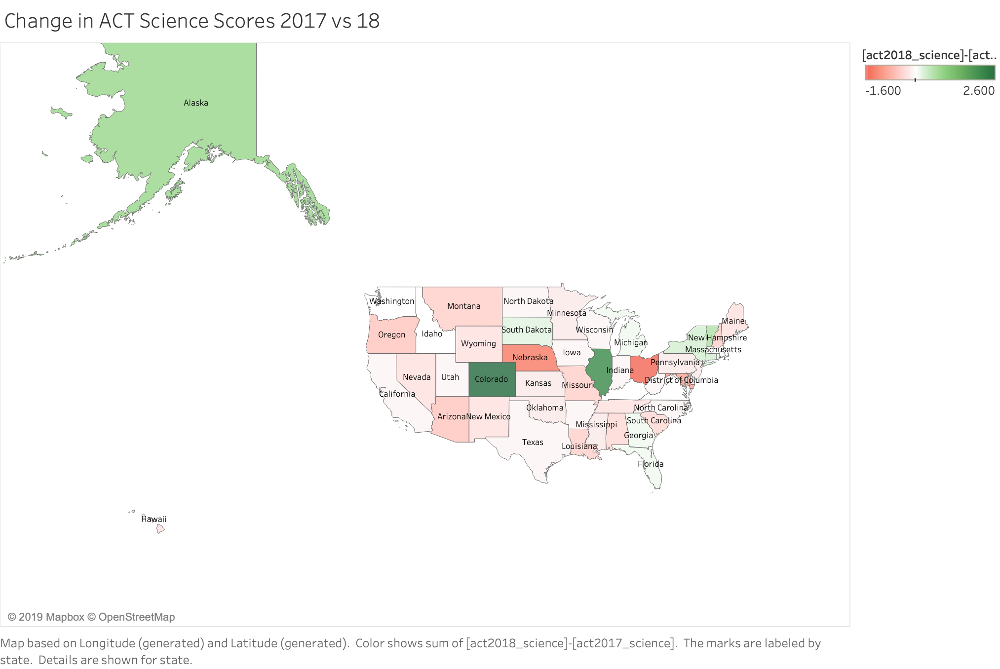

In [1427]:
Image(filename='png/ACT Science %.png')

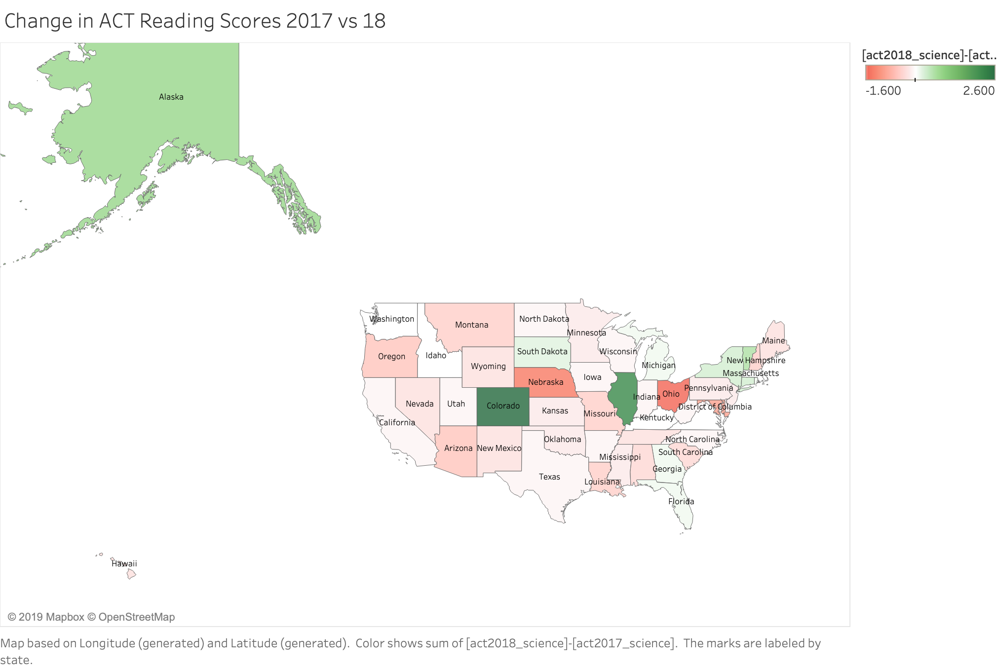

In [1428]:
Image(filename='png/ACT Reading %.png')

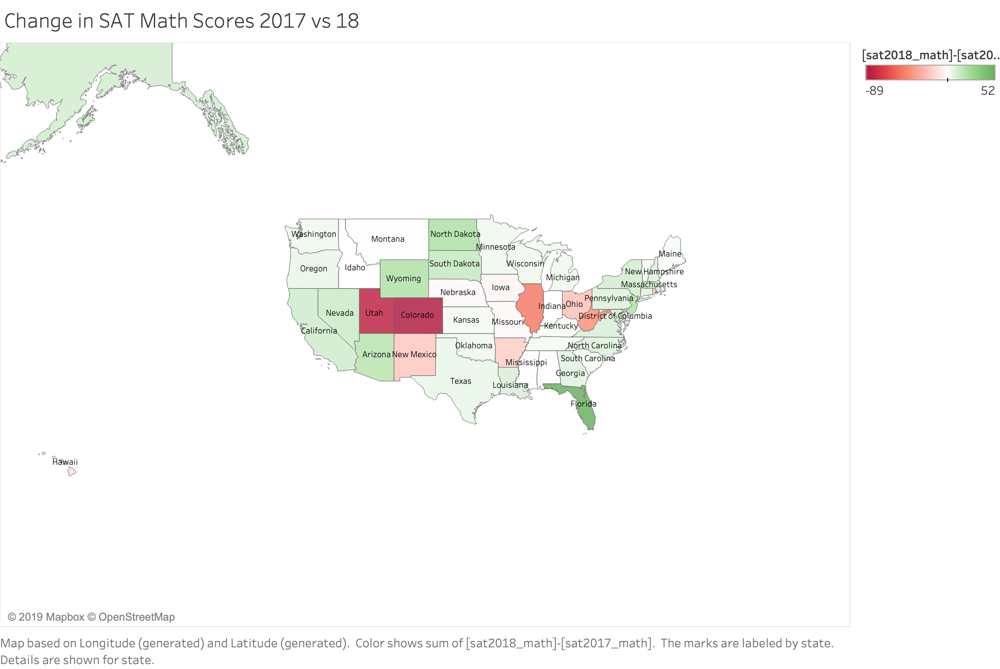

In [1429]:
Image(filename='png/SAT Math %.png')

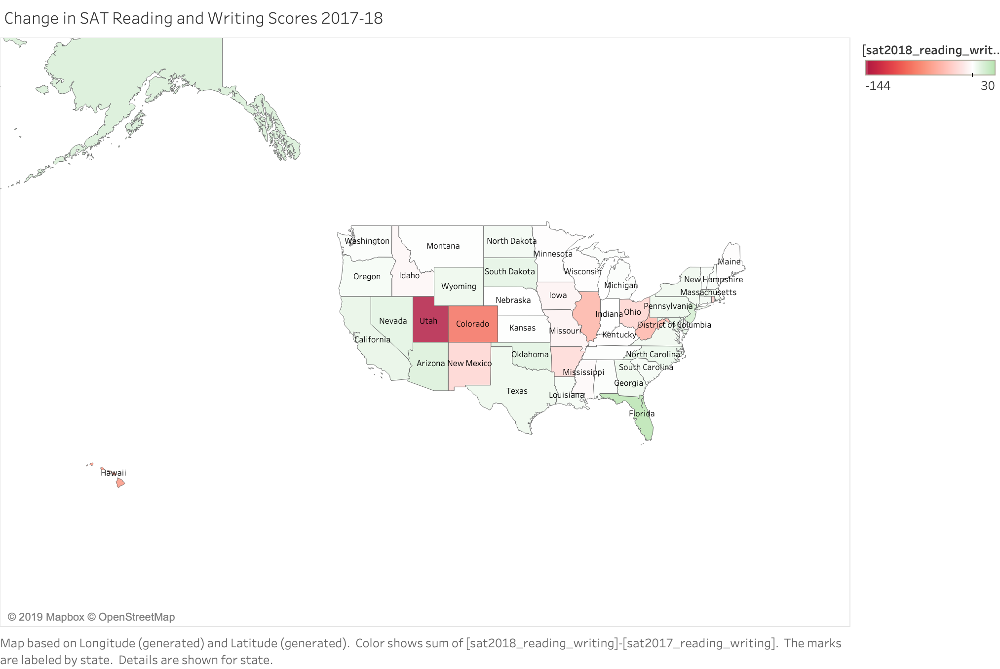

In [1430]:
Image(filename='png/SAT RW%.png')

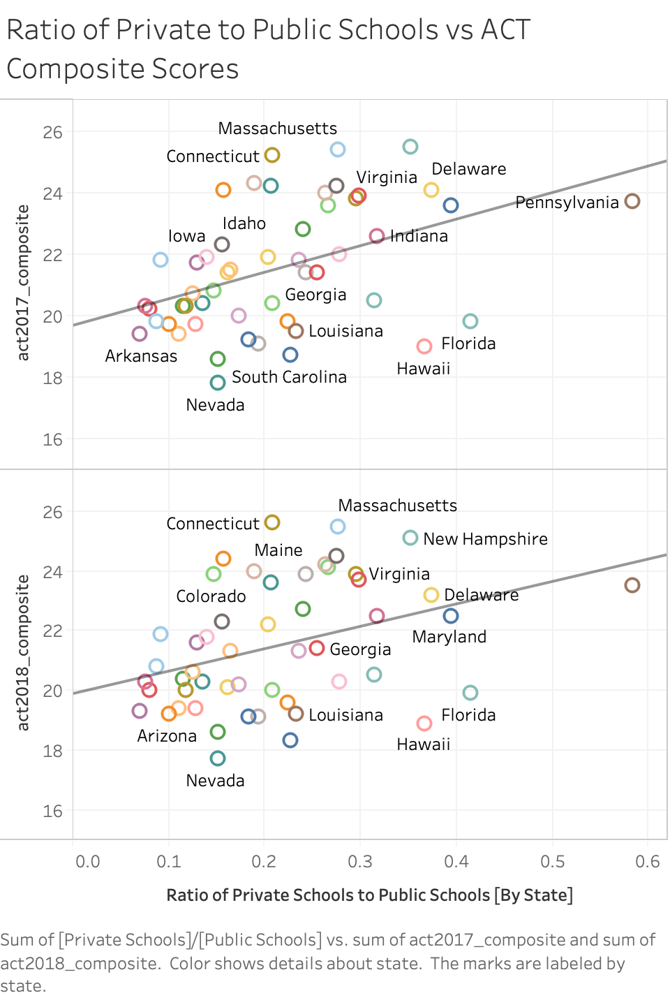

In [1431]:
Image(filename='png/Ratio Pri_Pub.png')

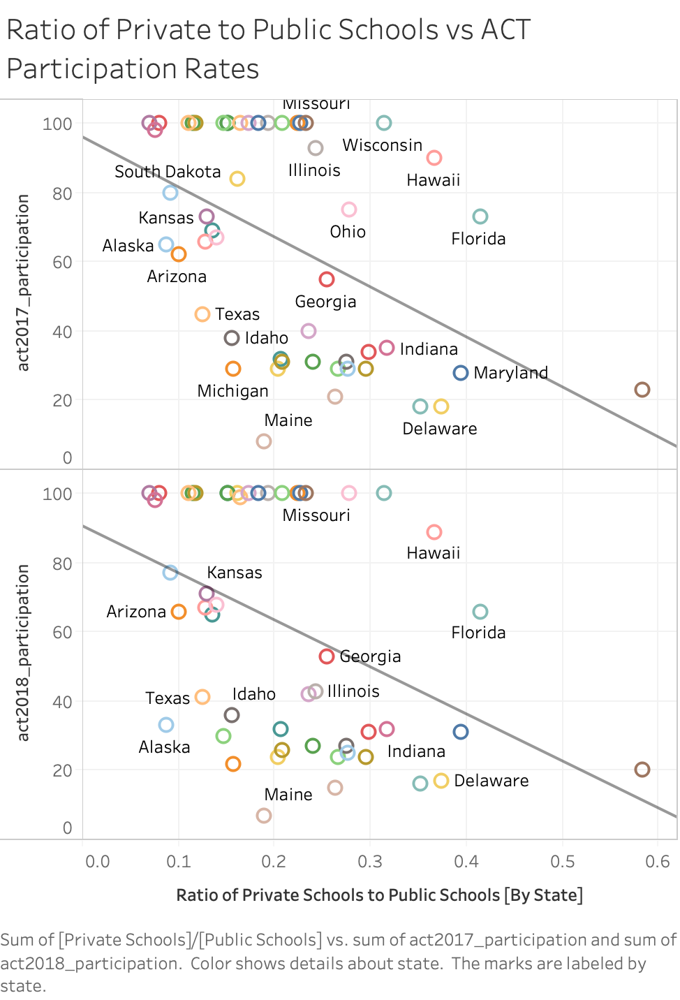

In [1432]:
Image(filename='png/Ratio Pri_Pub (2).png')

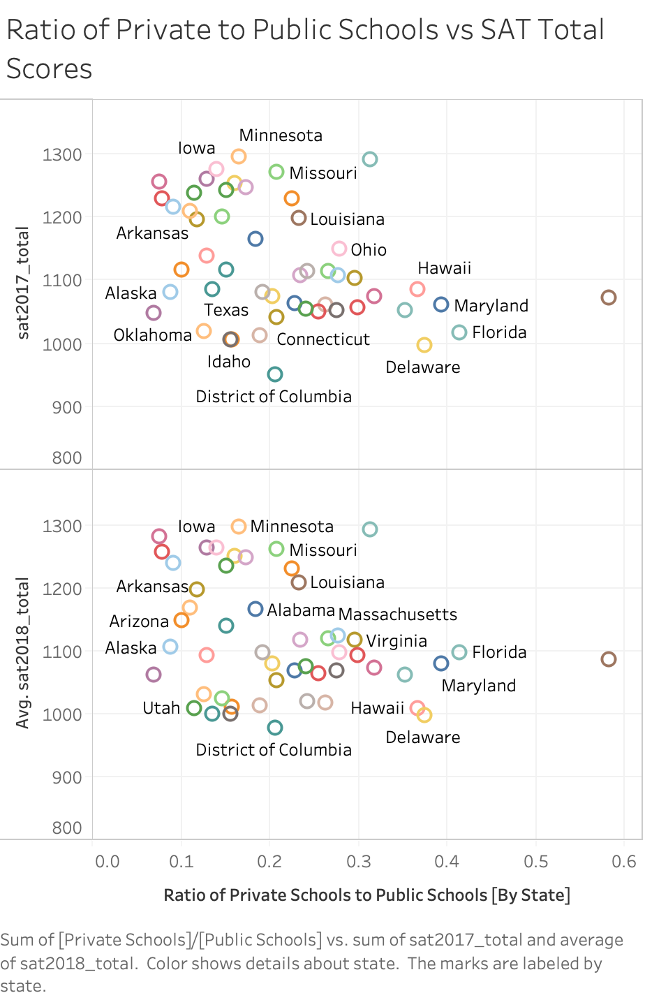

In [1433]:
Image(filename='png/Ratio PriPub 2.png')

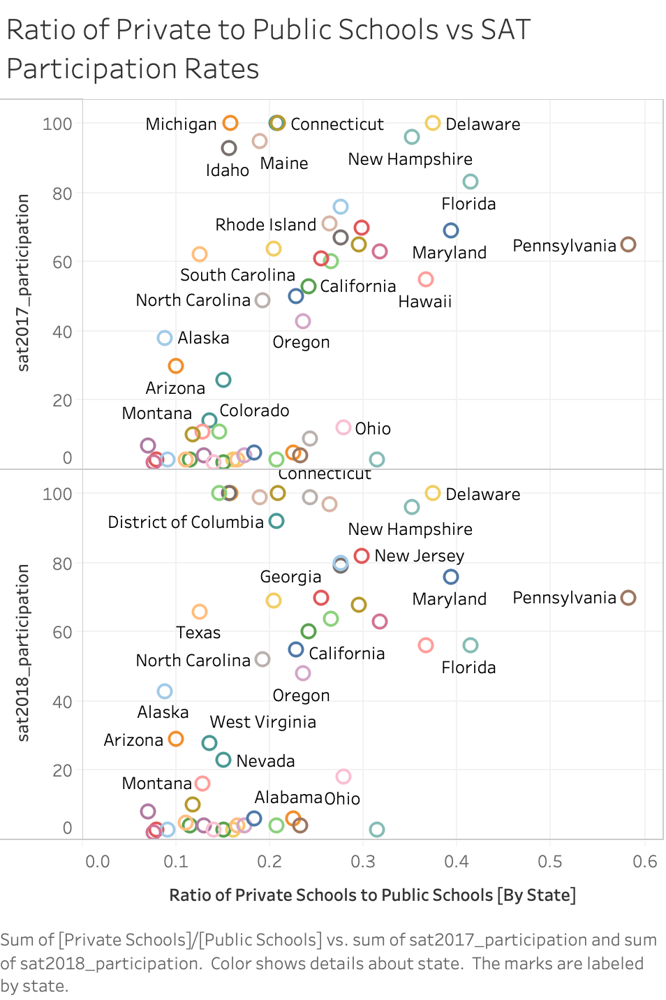

In [1434]:
Image(filename='png/Ratio PriPub 2 (2).png')

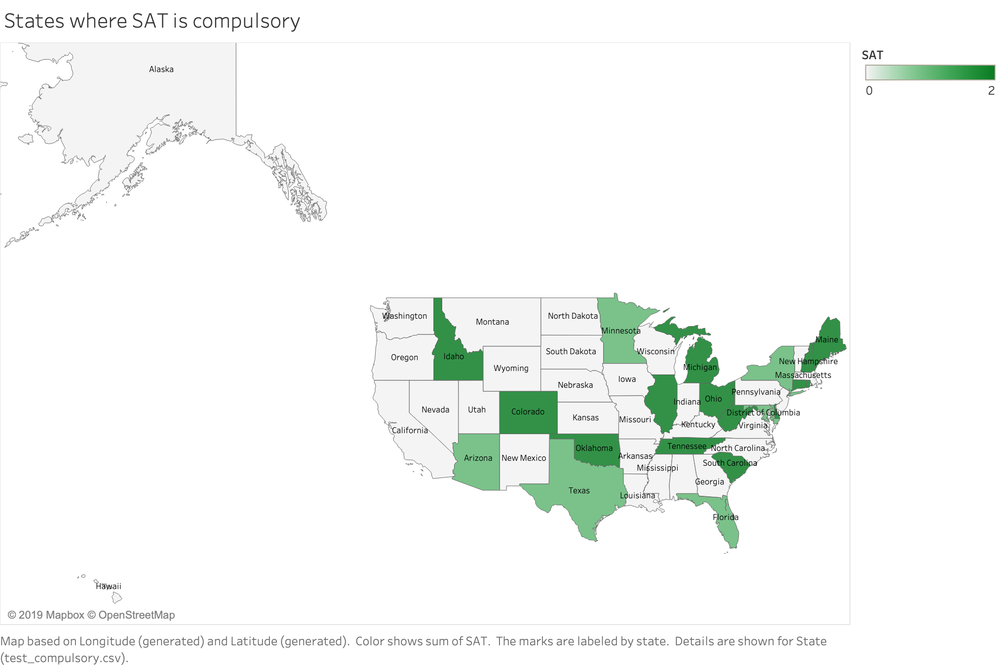

In [1435]:
Image(filename='png/SAT_comp.png')
#Dark Green indicates compulsory for SAT, 
#light green indicates optional for SAT/ACT,
#and white indicates not required.

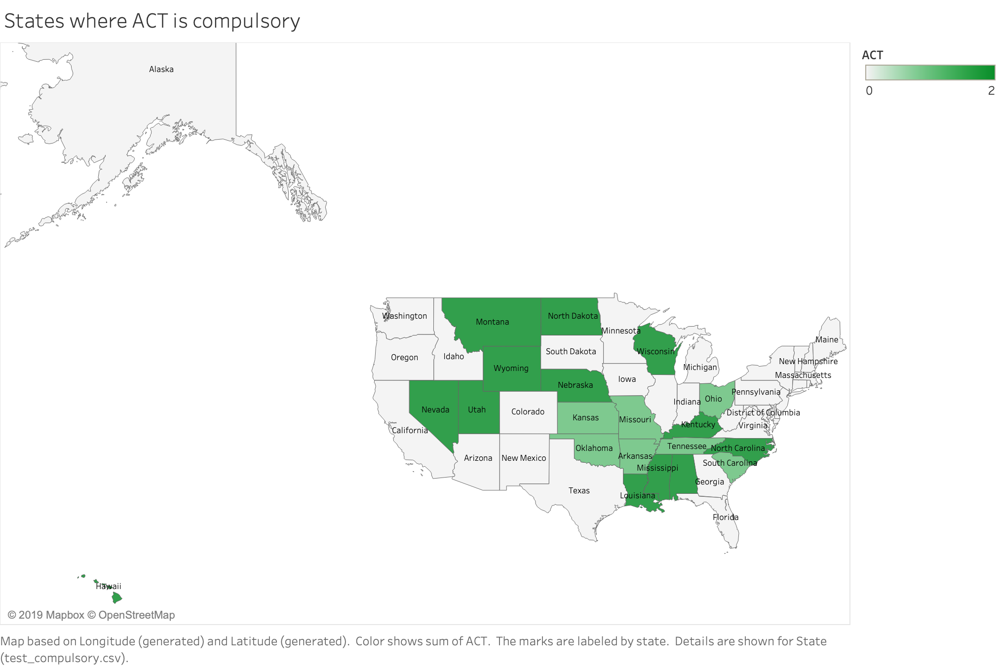

In [1436]:
Image(filename='png/ACT_comp.png')
#Dark Green indicates compulsory for ACT, 
#light green indicates optional for SAT/ACT,
#and white indicates not required.

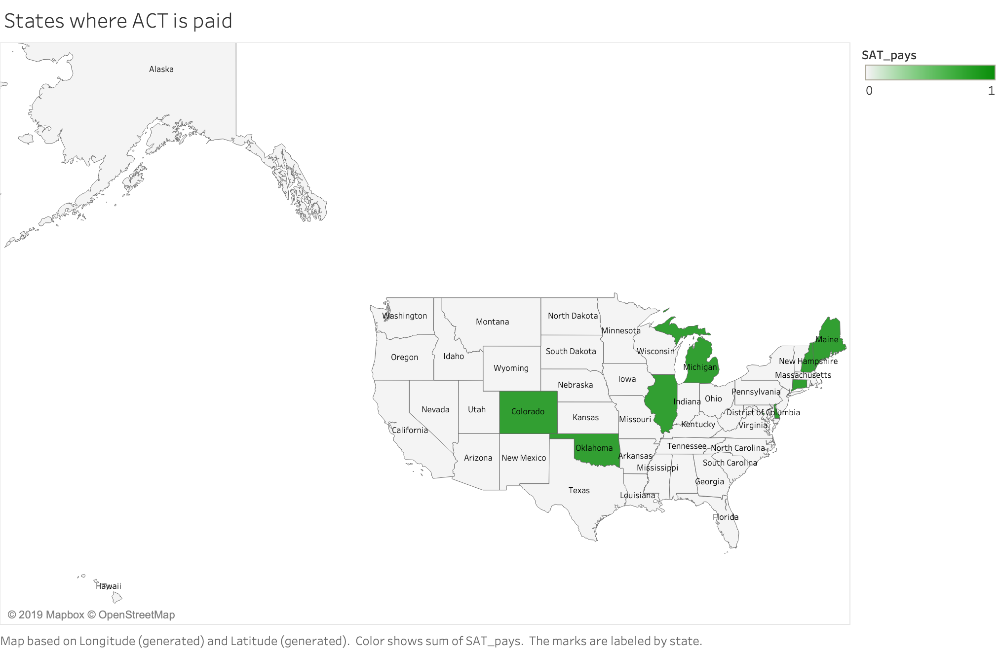

In [1437]:
Image(filename='png/SAT_Paid.png')
#Green indicates state funding for SAT, white indicates no funding

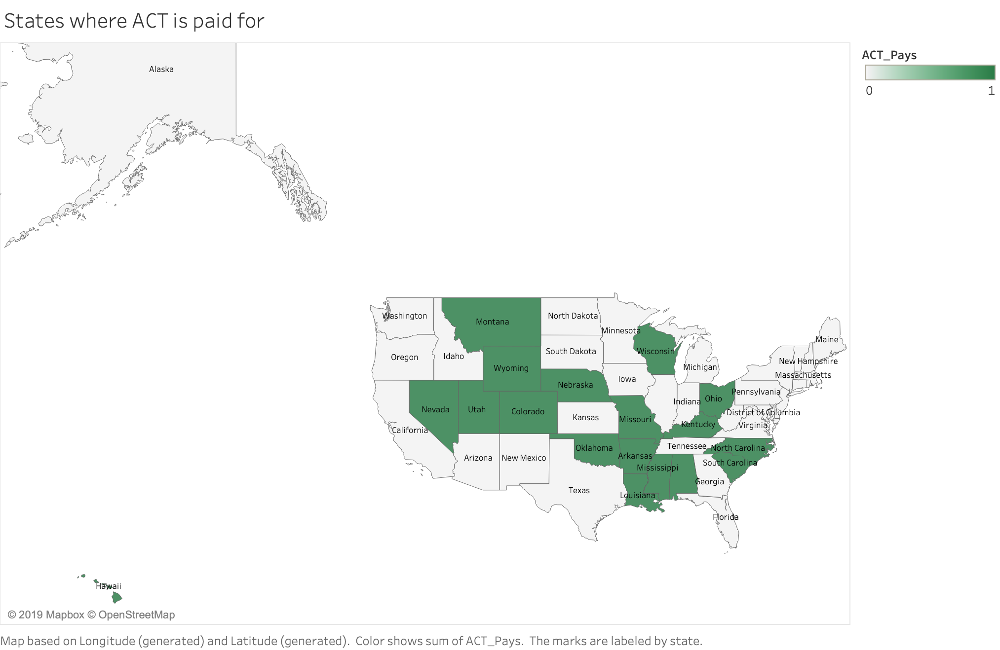

In [1438]:
Image(filename='png/ACT_Paid.png')
#Green indicates state funding for ACT, white indicates no funding

## Descriptive and Inferential Statistics

#### Summarizing Distributions

Above, we used pandas `describe` to provide quick summary statistics of our numeric columns. We also demonstrated many visual relationships.

As data scientists, having a complete understanding of data is imperative prior to modeling.

While we will continue to build our analytic tools, we know that measures of *central tendency*, *spread*, and *shape/skewness* provide a quick summary of distributions.

For each variable in your data, summarize the underlying distributions (in words & statistics)
 - Be thorough in your verbal description of these distributions.
 - Be sure to back up these summaries with statistics.

In [1439]:
act.describe()

,act2017_participation,act2017_english,act2017_math,act2017_reading,act2017_science,act2017_composite
count,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000
mean,65.254902,20.931373,21.182353,22.013725,21.450980,21.519608
std,32.140842,2.353677,1.981989,2.067271,1.739353,2.020695
min,8.000000,16.300000,18.000000,18.100000,18.200000,17.800000
25%,31.000000,19.000000,19.400000,20.450000,19.950000,19.800000
50%,69.000000,20.700000,20.900000,21.800000,21.300000,21.400000
75%,100.000000,23.300000,23.100000,24.150000,23.200000,23.600000
max,100.000000,25.500000,25.300000,26.000000,24.900000,25.500000


In [1440]:
act_2018.describe()

,act2018_participation,act2018_english,act2018_math,act2018_reading,act2018_science,act2018_composite
count,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000
mean,61.647059,20.988235,21.125490,22.015686,21.345098,21.486275
std,34.080976,2.446356,2.035765,2.167245,1.870114,2.106278
min,7.000000,16.600000,17.800000,18.000000,17.900000,17.700000
25%,28.500000,19.100000,19.400000,20.450000,19.850000,19.950000
50%,66.000000,20.200000,20.700000,21.600000,21.100000,21.300000
75%,100.000000,23.700000,23.150000,24.100000,23.050000,23.550000
max,100.000000,26.000000,25.200000,26.100000,24.900000,25.600000


Answers: 

**Participation Rates**

SAT: SAT Participation rates are not normally distributed. In 2017, the graph shows right skewness given there is a huge peak at lower participation rates, however median is slightly below the mean, indicating a small skew towards the left. However in 2018, participation rates have a clear right skew, with median at 52% and mean at 46%.

ACT: ACT Participation rates are also not normally distributed but skewed towards the left. This is evident where the 75% percentile is 100% for both 2017 and 2018, and the median is also ~5% above the mean in both cases.

**Total/Composite Scores**

SAT: The 2017 and 2018 SAT total scores are also both skewed to the left with their means, 1126 and 1126 respectively, greater than their medians, 1107 and 1099 respectively

ACT: The 2017 and 2018 ACT composite scores are normally distributed with their means and medians being roughly equal. 

**SAT Subjects**

Reading and Writing: The 2017 and 2018 scores are both left skewed, as their means, 569 and 563 respectively, are greater than the median scores - 559 and 552 respectively.

Math: The 2017 and 2018 scores are both left skewed, as their means, 557 and 556 respectively, are greater than the median scores - 548 and 544 respectively.

**ACT Subjects**

All ACT subjects have a slight left skew - with their means being greater than the median score. This may mean that they are near normal - and may approach a normal distribution with a larger sampling size.


#### We generally assuming that data we sample from a population will be normally distributed. Do we observe this trend?

Answer: The assumption holds for ACT scores, however not for the SATs. This may be a result of the SAT having a smaller population size compared to the ACT - with the smaller states causing slight skewness due to the low population size and participation rates

Does This Assumption Hold for:
    - Math
    - Reading
    - Rates
Explain your answers for each distribution and how you think this will affect estimates made from these data.

Answer:

Similar to before, scores and participation rates are generally normally distributed for the ACT however there is still a clear skewness in the SAT scores.

Given a non-normal distribution, making estimates from this data will not be accurate given the true mean is unknown.

#### Estimate Limits of Data

Suppose we only seek to understand the relationship between SAT and ACT participation rates in 2017. 

##### Does it make sense to conduct statistical inference given these data specifically? 

Why or why not?

*(think about granularity, aggregation, the relationships between populations size & rates...consider the actually populations these data describe in answering this question)*

Answer: Yes as they are comparable data. The population that they are drawing from are also similar (pre-college students).

##### Is it appropriate to compare *these* specific SAT and ACT math scores? 

Why or why not?

Answer: No it is not appropriate as they are not comparable data as the method of calculation is different. SAT scores report a raw score, whereas ACT scores are already scaled.

#### Statistical Evaluation of Distributions 

**If you feel it's appropriate**, using methods we discussed in class, run hypothesis tests to compare variables of interest in our dataset. 

In [1441]:
# Code:

## Outside Research

Based upon your observations, choose **three** states that demonstrate interesting trends in their SAT and/or ACT participation rates. Spend some time doing outside research on state policies that might influence these rates, and summarize your findings below. **Feel free to go back and create new plots that highlight these states of interest**. If you bring in any outside tables or charts, make sure you are explicit about having borrowed them. If you quote any text, make sure that it renders as being quoted. (Make sure that you cite your sources -- check with you local instructor for citation preferences).

The 3 states that I will be investigating will be:

1. Colorado - The drop in ACT participation and rise in SAT participation rates
Colorado had switched from ACT to SAT tests in 2015, however the first entire cohort to take the SAT as part of a mandatory college test only commenced in 2018. However in 2019 the government had announced to drop mandatory testing, which might result in overall participation rates in college testing in Colorado further declining. (Source: https://www.testive.com/colorado-sat-change-2017/, https://legalinsurrection.com/2019/09/college-in-colorado-drops-sat-act-requirement-to-increase-campus-diversity/)

2. Minnesota - The highest SAT scores by state, and highest scores for Reading and Writing and Maths
Whilst Minnesota's SAT scores are the highest and even so when broken down by subjects, their participation rates are very low. This may mean that only the well-prepared, or more affluent (as they will be able to pay to retake) or ambitious (depending on university requirements) would take the test. This would skew the state's average towards a higher end and hence reflecting a higher average.


3. Illinois - Just like Colorado - had a drop in the ACT participation and rise in SAT participation rates (this has also resulted in an overall better ACT average)
Illinois was able to achieve a higher participation rate for SATs as it is offered state-wide. In 2016, Illinois had reported that they will replace ACTs with SAT and the test will be fully state-funded.
(Source:https://www.chicagotribune.com/news/ct-illinois-chooses-sat-met-20160211-story.html)



## Conclusions and Recommendations

Based on your exploration of the data, what are you key takeaways and recommendations? Choose one state with a lower participation rate and provide a suggestion for how the College Board might increase participation amongst graduating seniors in this state. Are there additional data you desire that would better inform your investigations?

For Minnesota that has a very low SAT participation rate at the moment at 4%, a suggestion for the College Board would be to actively encourage participation rates through public funding for tests, or to ensure college testing is mandatory for all college students.

To inform my investigations, additional data that could be interesting to explore are candidate information such as gender, first language, parent's highest education, average student teacher ratios, students' choice of university and degree. All of these could be interesting to further understand how graduating seniors make their decision between participating in college tests and as to which test they take.

## *Additional Data Sources
Median Household Income and Ethnicity, by State: US Census (https://www.census.gov/topics/income-poverty/income/data/tables.html)

Ethnicity by Students: College Board (https://research.collegeboard.org/programs/sat/data/archived/2018-sat-suite-annual-report)

States offering public funding/where SAT or ACT is mandatory: https://magoosh.com/hs/act/2017/states-that-require-the-act-or-sat/

Public/Private Schools by State: https://nces.ed.gov/programs/digest/mobile/Menu.aspx